# Dogs vs. Cats - MLDS Final Project


**Shahar Ehrenhalt, ID 300342409**

**Omri Yaffe, ID 322404252**

**Oren Avidan, ID 304823735**

*Reichman University, June 2024*

**NOTE:** The data will be downloaded autmatically from the Kaggle challenge using an API.

# Part 0 - Introduction, Imports, and Pre-processing of the Data


## Intro
The project deals with image classification of Dogs and Cats. In this project we will use different models for classifying the images and then will examine the effects of permuting the images over the performance of the trained models. We will create permuted images and see the influence of the number of tiles and the permutation complexity (for the same number of tiles) on the models' performances. Lastly, we will suggest 3 methods for improving those results and see if those methods indeed improve the models' results.



## Imports

In [4]:
# Select if running on Google Colab or Windows
colab = True

In [ ]:
!pip install datasets==2.19.2
!pip install accelerate==0.30.1
!pip install transformers[torch]==4.41.2

In [5]:
# NP and Pandas
import numpy as np
import pandas as pd
import math
from scipy.spatial.distance import cdist

# PLT
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
import seaborn as sns

# loading data
import json

# OS and general
import os
import random
from glob import glob
import shutil
from tqdm import tqdm

# image resizing
import albumentations as A
import cv2

# data splitting
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# PyTorch
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import ImageFolder
from torchvision import transforms
from torch.utils.data import random_split
import torchvision.models as models
import torch.nn as nn
from torch.optim import Adam

if colab == True:
    pass
else:
    # for windows run take off note for the next one
    import opendatasets as od
    import zipfile

from datasets import load_dataset
from datasets import load_metric
from transformers import ViTImageProcessor
from transformers import ViTForImageClassification
from transformers import TrainingArguments
from transformers import Trainer
from transformers import AutoModelForImageClassification
from safetensors.torch import load_model, save_model

In [6]:
import warnings
warnings.filterwarnings("ignore")

pd.options.mode.chained_assignment = None

In [7]:
colors = ['lightskyblue','coral']
custom_palette = sns.color_palette(colors)

In [8]:
# fixing seed value to receive the same results in each run
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)

seed = 42
set_seed(seed)

In [9]:
df_model_metrics = pd.DataFrame(columns=[
    'Model', 'Num Epochs', 'Batch Size', 'Learning Rate',
    'Desired Image Size', 'Seed', 'Num Tiles', 'Hypothesis Description',
    'Accuracy', 'Precision', 'Recall', 'F1-Score', 'Complexity'
])

In [10]:
# use GPU for faster training and evaluating
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [11]:
from huggingface_hub import login, notebook_login

login('')

The token has not been saved to the git credentials helper. Pass `add_to_git_credential=True` in this function directly or `--add-to-git-credential` if using via `huggingface-cli` if you want to set the git credential as well.
Token is valid (permission: write).
Your token has been saved to /root/.cache/huggingface/token
Login successful


## Data Import

### Downloading Data

The project uses Kaggle's [Dogs vs Cats](https://www.kaggle.com/c/dogs-vs-cats) dataset, downloaded via API.

In [12]:
if colab == True:

    api_token = {"username":"","key":""}
    os.makedirs(os.path.join(os.path.expanduser('~'), '.kaggle'), exist_ok=True)
    with open('/root/.kaggle/kaggle.json', 'w') as file:
        file.write(json.dumps(api_token))

    !chmod 600 /root/.kaggle/kaggle.json
    !kaggle competitions download -c dogs-vs-cats

else:
    api_token = {'username': '', 'key': ''}

    with open('kaggle.json', 'w') as file:
        json.dump(api_token, file)

    od.download('https://www.kaggle.com/c/dogs-vs-cats')

    data_folder = 'dogs-vs-cats'

 98% 799M/812M [00:09<00:00, 148MB/s]
100% 812M/812M [00:09<00:00, 90.0MB/s]


### Unzipping the Data

Since the data is downloaded from a Kaggle challenge, the test set doesn't include labels. Thus we will unzip only the train set and will use part of it to create the test set ourselves.

#### Colab Version

In [13]:
if colab == True:
    if os.path.exists('train.zip') and os.path.exists('test1.zip') and os.path.exists('sampleSubmission.csv'):
        print("dogs-vs-cats.zip has already been unzipped.")
    else:
        print("unzipping dogs-vs-cats.zip...")
        !unzip -q dogs-vs-cats.zip
        print("dogs-vs-cats.zip has been unzipped successfully.")

    if os.path.isdir('raw_data'):
        print("train.zip has already been unzipped.")
    else:
        print("unzipping train.zip...")
        !unzip -q train.zip
        os.rename('train', 'raw_data')
        print("train.zip has been unzipped successfully.")

    print(' ')
    print('Files currently in directory are:')
    print('------------------------------')
    !ls

else:

    if os.path.isdir('raw_data'):
        print("train.zip has already been unzipped.")
    else:
        print("unzipping train.zip...")
        with zipfile.ZipFile(f'{data_folder}/train.zip', 'r') as zip_ref:
            zip_ref.extractall('.')
        print("train.zip has been unzipped successfully.")
        os.rename('train','raw_data')

    print(' ')
    print('Files currently in directory are:')
    print('------------------------------')

    os.listdir()

unzipping dogs-vs-cats.zip...
dogs-vs-cats.zip has been unzipped successfully.
unzipping train.zip...
train.zip has been unzipped successfully.
 
Files currently in directory are:
------------------------------
dogs-vs-cats.zip  raw_data  sample_data  sampleSubmission.csv  test1.zip  train.zip


### Using part of the data only

Due to the large size of the dataset, and to save training time, we dropped 25% of the original data, in equal parts from each category, believng that it will still be enough to drive good predictions.

In [14]:
# Take only 0.75 of the entire data for faster training/evaluation
dataset_size = 0.75

In [15]:
# taking dataset_size part of the data in equal parts of dogs and cats:

if not os.path.isdir('full_raw_data'):
  images = os.listdir('raw_data')
  dog_imgs = [img for img in images if 'dog' in img]
  cat_imgs = [img for img in images if 'cat' in img]
  np.random.seed(42)
  used_dog_imgs = np.random.choice(dog_imgs,int(12500*dataset_size),replace=False)
  used_cat_imgs = np.random.choice(cat_imgs,int(12500*dataset_size),replace=False)

  used_imgs = np.concatenate([used_dog_imgs,used_cat_imgs])

  os.rename('raw_data','full_raw_data')
  os.makedirs('raw_data')
  for f in used_imgs:
    shutil.copyfile(os.path.join('full_raw_data',f),os.path.join('raw_data',f))

### Change the Folder layout

In this part we changed the folder layout to two different folders of cat images and dogs images, for faster and more convenient use in the future.

In [16]:
# Get a list of all the image files in train_dir create a new subfodler for each class
image_files = [f for f in os.listdir('raw_data') if f.endswith('.jpg')]

if not image_files:
    print("No image files found in the train directory, already created subdirectories and moved files.")
else:
    # Create subdirectories for each class
    classes = np.unique([f.split('.')[0] for f in image_files])
    for class_name in classes:
        os.makedirs(os.path.join('raw_data', class_name), exist_ok=True)

    # Move the image files into the appropriate subdirectories
    for image_file in image_files:
        class_name = image_file.split('.')[0]
        image_file_name = image_file.split('.')[1] + '.' + image_file.split('.')[2]
        shutil.move(os.path.join('raw_data', image_file), os.path.join('raw_data', class_name, image_file_name))

In [17]:
raw_data_dir = 'raw_data'
file_list = os.listdir(raw_data_dir)
file_list[:5]

['cat', 'dog']

## Data exploration

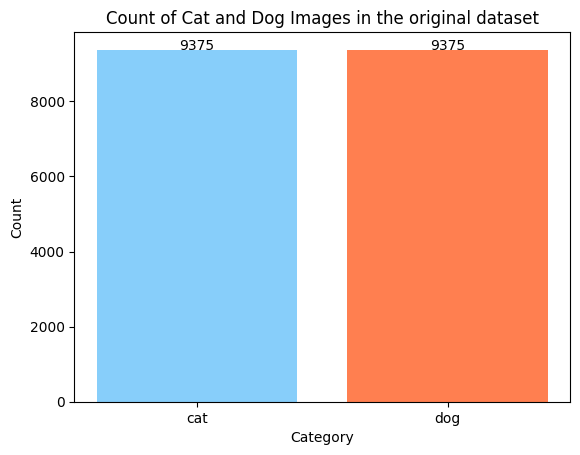

In [18]:
image_sizes = []
categories = {'cat': 0, 'dog': 0}

for category in os.listdir(raw_data_dir):
    categories[category] = len(os.listdir(os.path.join(raw_data_dir, category)))

for category in os.listdir(raw_data_dir):
    for filename in os.listdir(os.path.join(raw_data_dir, category)):
        image_path = os.path.join(raw_data_dir, category, filename)
        with Image.open(image_path) as img:
            image_sizes.append(img.size)

plt.bar(categories.keys(), categories.values(), color=colors)
for i, count in enumerate(categories.values()):
    plt.text(i, count, str(count), ha='center')
plt.title('Count of Cat and Dog Images in the original dataset')
plt.xlabel('Category')
plt.ylabel('Count')
plt.show()

We can see that after removing 25% of the data, we have 7,375 images for each type, 18,750 in total.

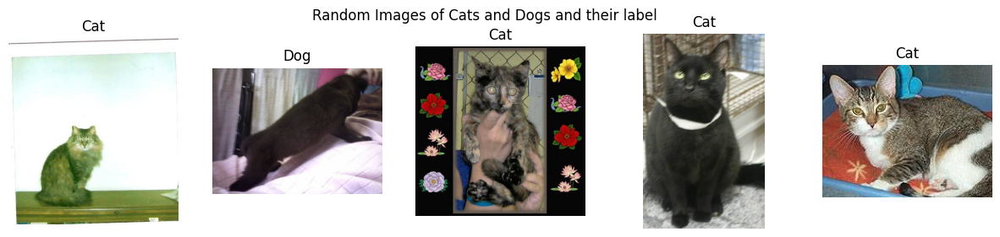

In [19]:
set_seed(seed)

# Selecting 5 random images
random_images = []
for i in range(5):
    category = random.choice(list(categories.keys()))
    image = random.choice(os.listdir(os.path.join(raw_data_dir, category)))
    random_images.append(os.path.join(raw_data_dir,category, image))

# Displaying images with labels
plt.figure(figsize=(15, 3))
for i, img in enumerate(random_images):
    plt.subplot(1, 5, i+1)
    plt.imshow(Image.open(img))
    plt.title('Cat' if 'cat' in img else 'Dog')
    plt.axis('off')
plt.suptitle('Random Images of Cats and Dogs and their label')
plt.show()



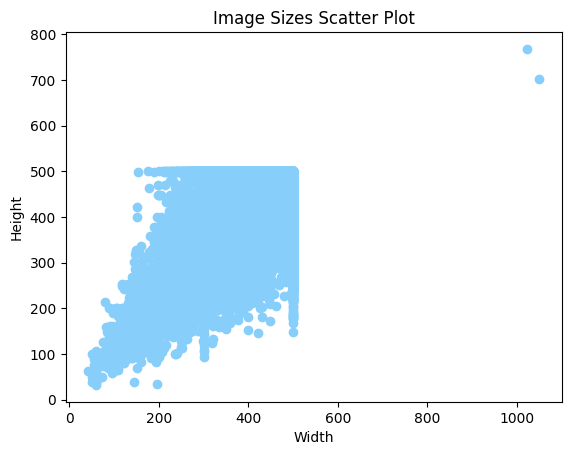

In [20]:
# Plotting image sizes
widths, heights = zip(*image_sizes)
plt.scatter(widths, heights, color=colors[0])
plt.title('Image Sizes Scatter Plot')
plt.xlabel('Width')
plt.ylabel('Height')
plt.show()

Here we can see that most iamges are at a maximal size of ~500x500 pixels. This is important to know to which sizes we can change the images in the future. Additional way to look at the sizes would be to look at the median of the witdh and height:

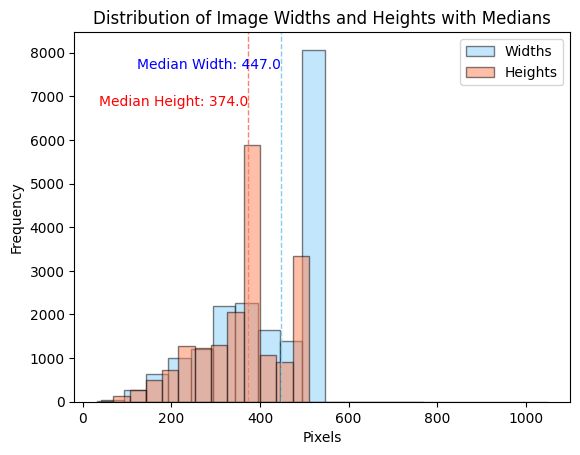

In [21]:
median_width = np.median(widths)
median_height = np.median(heights)

plt.hist(widths, bins=20, alpha=0.5, label='Widths', color=colors[0], edgecolor='black')
plt.hist(heights, bins=20, alpha=0.5, label='Heights', color=colors[1], edgecolor='black')
plt.axvline(median_width, color='skyblue', linestyle='dashed', linewidth=1)
plt.axvline(median_height, color='salmon', linestyle='dashed', linewidth=1)
plt.text(median_width, plt.ylim()[1]*0.9, f'Median Width: {median_width}', color='blue', ha='right')
plt.text(median_height, plt.ylim()[1]*0.8, f'Median Height: {median_height}', color='red', ha='right')

plt.title('Distribution of Image Widths and Heights with Medians')
plt.xlabel('Pixels')
plt.ylabel('Frequency')
plt.legend()
plt.show()


We can see that 50% of the images are 374 pixels high and 447 pixel width. That means we can transform them to images of size of ~300x300 size or smaller, according to our discretion.

## Inital hyper-params

We will initialize hyper-params for our model, together with the desired image size that will indicate the image size that will be used for the NN model:

In [22]:
# model hyper-params
test_part_of_total_images = 0.2
num_epochs = 5
batch_size = 32
num_workers = 4
learning_rate = 5e-5

# images hyper-params
desired_image_size = 224 # used 224 to support the pre-trained weights of the resnet50 and vit models
num_tiles = 1 # initial num_tiles should be 1

# hypothesis hyper params
hypothesis_description = 'classic_image_classification'
seed = 1

We defined the desired image size to be 224 to support the pre-trained weights of the resnet50 and vit models. As mentioned, since most of the images are in size of ~300x300, 224 will not make us lose any important information. Number of tiles is set to 1 as a default value.

## Setting up Datasets and Dataloaders


In order to be able to manage our RAM efficiently, we have decided to use Datasets and Dataloaders of PyTorch. Those objects will enable us to manage our data more easily and quickly access images, resize them, divide epochs to batches, and more.

In [23]:
transform = transforms.Compose([
    transforms.Resize((desired_image_size, desired_image_size)),
    transforms.ToTensor(),
])

In [24]:
dataset = ImageFolder(raw_data_dir,transform=transform)

### Normalized image for example

Since we will be using NN to classify the images, the input to the NN should be all in the same size. To do that we need to resize all images to the size set before.

In [25]:
def show_normalized_image(image):
    image_tensor, _ = image
    transform = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    image_tensor = transform(image_tensor)

    # Convert to a format suitable for display (H, W, C)
    image_to_display = image_tensor.permute(1, 2, 0)

    image_to_display = image_to_display.numpy()

    # normalize pixel values to be in rage of [0, 1]
    image_to_display = (image_to_display - image_to_display.min()) / (image_to_display.max() - image_to_display.min())

    plt.imshow(image_to_display)
    plt.title(f'Resized Image of size {desired_image_size} x {desired_image_size}')
    plt.show()

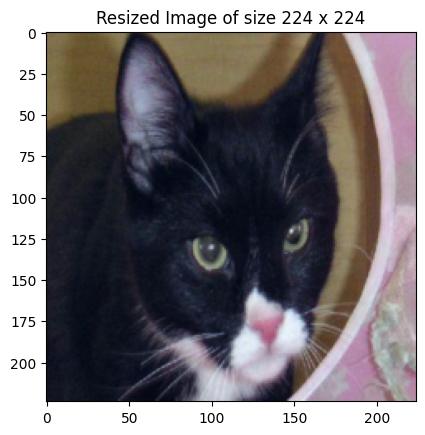

In [26]:
show_normalized_image(dataset[2])

## Functions for Future Use

### Plotting Functions

#### get_class_distribution

In [ ]:
def get_class_distribution(loader):
    count_dict = {0: 0, 1: 0}

    for _, labels in loader:
        labels = labels.numpy()
        unique, counts = np.unique(labels, return_counts=True)
        for label, count in zip(unique, counts):
            count_dict[label] += count

    return count_dict

#### autolabel

In [ ]:
# Function to attach a text label above each bar, displaying its height
def autolabel(rects,ax):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

#### plot_confusion_matrix

In [ ]:
def plot_confusion_matrix(df, num_tiles, model_name):
    ax = sns.heatmap(df, annot=True, fmt='d', cmap='YlGnBu', cbar=True)
    ax.set_title(f'{model_name} confusion matrix with {num_tiles**2} Tiles')
    ax.set_xlabel('Predicted Category')
    ax.set_ylabel('Actual Category')

    plt.tight_layout()
    plt.show()


#### display_images_and_predictions

In [ ]:
def display_images_and_predictions(model, test_loader, model_name='resnet50'):
    model.eval()

    # use GPU if available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)  # Move model to the correct device

    images, labels, preds = [], [], []

    with torch.no_grad():
        for inputs, labels_batch in test_loader:
            inputs = inputs.to(device)  # Move inputs to the same device as the model
            outputs = model(inputs)
            if model_name == 'resnet50':
                # resnet
                _, preds_batch = torch.max(outputs.data, 1)
            elif model_name == 'vit':
                # ViT
                _, preds_batch = torch.max(outputs.logits, 1)

            # Move tensors back to CPU for further processing
            images.extend(inputs.cpu())
            labels.extend(labels_batch.cpu())
            preds.extend(preds_batch.cpu())
            if len(images) >= 5:
                break

    images = [image.numpy().transpose((1, 2, 0)) for image in images[:5]]
    labels = [label.item() for label in labels[:5]]
    preds = [pred.item() for pred in preds[:5]]

    fig, axs = plt.subplots(1, 5, figsize=(15, 3))
    for i, (image, label, pred) in enumerate(zip(images, labels, preds)):
        axs[i].imshow(image)
        axs[i].axis('off')
        axs[i].set_title(f'True: {label}\nPred: {pred}')

    plt.show()




#### grouped_bar_plot

In [ ]:
def grouped_bar_plot(df, ax, num_tiles, title,bar_width,metrics):
    unique_seeds = df['Seed'].unique()

    n_bars = len(unique_seeds)
    total_bar_width = n_bars * bar_width

    indices = np.arange(len(metrics))

    for i, seed in enumerate(unique_seeds):
        seed_df = df[df['Seed'] == seed]
        bar_positions = indices - (total_bar_width / 2) + (i * bar_width) + (bar_width / 2)
        ax.bar(bar_positions, seed_df[metrics].values[0], width=bar_width, label=f'Seed {seed}')

    ax.set_xticks(indices)
    ax.set_xticklabels(metrics)
    ax.set_title(title)
    ax.set_xlabel('Metrics')
    ax.set_ylabel('Score')
    ax.legend(loc='upper right')

### Image Permutation

#### shuffle_tiles_single_image

In [ ]:
def shuffle_tiles_single_image(image,permutation):
    w, h = image.size
    num_tiles = int(np.sqrt(len(permutation)))
    tile_w, tile_h = int(w / num_tiles), int(h / num_tiles)
    tiles = [image.crop((i*tile_w, j*tile_h, (i+1)*tile_w, (j+1)*tile_h)) for i in range(num_tiles) for j in range(num_tiles)]

    # Reorder tiles according to the fixed permutation
    tiles = [tiles[i] for i in permutation]
    shuffled_image = Image.new('RGB', image.size)
    for idx, tile in enumerate(tiles):
        row, col = divmod(idx, num_tiles)
        shuffled_image.paste(tile, (col*tile_w, row*tile_h))
    return shuffled_image

#### permute_images

In [ ]:
def permute_images(base_dir, num_tiles=2, seed=1, num_images_to_show=5,permuted_train_tiles_seeds_paths={}):
    # Define the permuted directory name so we can use that later to understand the features of the permuted image
    permuted_dir = f'{base_dir}_permuted_seed{seed}_tiles{num_tiles}'

    # check if permuted directory already exists
    if not os.path.exists(permuted_dir):
        os.makedirs(permuted_dir)
    else:
        # if exists, return the path to the directory containing permuted images
        dict_path=f"{base_dir}_{seed}_{num_tiles}"
        if dict_path in permuted_train_tiles_seeds_paths:
            return permuted_train_tiles_seeds_paths
        else:
            permuted_train_tiles_seeds_paths[dict_path] = permuted_dir
            return permuted_train_tiles_seeds_paths

    np.random.seed(seed)

    # Define a fixed permutation of the tile indices
    num_total_tiles = num_tiles * num_tiles
    tile_permutation = np.random.permutation(num_total_tiles)  # This will be consistent due to fixed seed

    # Function to shuffle tiles
    def shuffle_tiles(image):
        w, h = image.size
        tile_w, tile_h = int(w / num_tiles), int(h / num_tiles)
        tiles = [image.crop((i*tile_w, j*tile_h, (i+1)*tile_w, (j+1)*tile_h))
                 for i in range(num_tiles) for j in range(num_tiles)]
        # Reorder tiles according to the fixed permutation
        tiles = [tiles[i] for i in tile_permutation]
        shuffled_image = Image.new('RGB', image.size)
        for idx, tile in enumerate(tiles):
            row, col = divmod(idx, num_tiles)
            shuffled_image.paste(tile, (col*tile_w, row*tile_h))
        return shuffled_image

    # Process and save permuted images
    total_images_to_tile = sum([len(files) for r, d, files in os.walk(base_dir)])
    with tqdm(total=total_images_to_tile,desc=f'Permutating images, {seed=}, {num_tiles=}') as pbar:
        for category in os.listdir(base_dir):
            for file_name in os.listdir(os.path.join(base_dir, category)):
                image_path = os.path.join(base_dir, category, file_name)
                image = Image.open(image_path)
                permuted_image = shuffle_tiles(image)
                permuted_image_path = os.path.join(permuted_dir, category, file_name)
                os.makedirs(os.path.join(permuted_dir, category), exist_ok=True)
                permuted_image.save(permuted_image_path)
                pbar.update(1)

    dict_path=f"{base_dir}_{seed}_{num_tiles}"
    # Return the path to the directory containing permuted images
    permuted_train_tiles_seeds_paths[dict_path] = permuted_dir
    return permuted_train_tiles_seeds_paths


#### get_permuted_path

In [ ]:
def get_permuted_path(base_dir,seed ,num_tiles,permuted_train_tiles_seeds_paths={}):
    dict_path=f"{base_dir}_{seed}_{num_tiles}"
    return permuted_train_tiles_seeds_paths[dict_path]

#### show_original_vs_permuted_images

In [ ]:
def show_original_vs_permuted_images(base_dir, num_images_to_show, permuted_dir, seed, num_tiles):
    plt.figure(figsize=(15, 8))
    plt.suptitle(f'Permutation Comparison: {num_tiles**2} Tiles, Seed {seed}', fontsize=16)

    # Take random jpgs from the base_dir subdirs
    random_files = np.random.choice(glob(os.path.join(base_dir, '*/*.jpg')), size=num_images_to_show, replace=False)

    for i, file_name in enumerate(random_files):
        # Extract the label from the directory name
        label = os.path.basename(os.path.dirname(file_name))  # Get the directory name which is the label

        # Original image
        image_path = file_name
        image = Image.open(image_path)
        plt.subplot(2, num_images_to_show, i + 1)
        plt.imshow(image)
        plt.title(f'Original - {label}')
        plt.axis('off')

        # Permuted image
        permuted_image_path = os.path.join(permuted_dir, label, os.path.basename(file_name))
        permuted_image = Image.open(permuted_image_path)
        plt.subplot(2, num_images_to_show, num_images_to_show + i + 1)
        plt.imshow(permuted_image)
        plt.title(f'Permuted - {label}')
        plt.axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

#### show_original_vs_permuted_images_with_complexity

In [ ]:
def show_original_vs_permuted_images_with_complexity(n_tiles_and_seeds,base_dir,permuted_train_tiles_seeds_paths):
    n_tiles_and_seeds = np.array(n_tiles_and_seeds)
    n_tiles = np.unique(n_tiles_and_seeds[:,0])
    seeds = n_tiles_and_seeds[:,1]
    file_name = os.path.join('cat',os.listdir(os.path.join(base_dir,'cat'))[0])

    f,ax = plt.subplots(len(n_tiles),len(seeds)//3+1,figsize=(15,15))

    for i,n in enumerate(n_tiles):
        ax[i,0].imshow(Image.open(os.path.join(base_dir,file_name)))
        ax[i,0].set_title('Original')
        for j in range(len(seeds)//3):
            seed = seeds[i*3+j]
            np.random.seed(seed)
            order = np.random.permutation(n**2)
            complexity = calculate_total_displacement_score(n,order)
            example_path = get_permuted_path(base_dir,seed,n,permuted_train_tiles_seeds_paths)
            ax[i,j+1].imshow(Image.open(os.path.join(example_path,file_name)))
            ax[i,j+1].set_title(f'N={n},Seed={seed},Complexity={complexity}')
plt.show()

#### transpose_permutation

In [ ]:
def transpose_permutation(permutation):
    num_tiles = int(np.sqrt(len(permutation)))
    permutation = np.array(permutation).reshape(num_tiles,num_tiles)
    permutation = permutation.T
    return permutation.flatten()

### Model Functions


#### Train Test Split

In [ ]:
def split_train_test(dataset, test_rate, raw_data_dir, train_dir, test_dir, torch_generator):
    test_size = int(test_rate * len(dataset))
    train_size = len(dataset) - test_size

    train_dataset, test_dataset = random_split(dataset, [train_size, test_size], generator = torch_generator)

    print(len(train_dataset), len(test_dataset))

    # Create directories if they don't exist
    dirs = [train_dir, test_dir]

    if os.path.exists(train_dir) and os.path.exists(test_dir):
        print("train and test directories already exist.")
        return train_dataset, test_dataset

    categories = ['cat', 'dog']
    for d in dirs:
        for c in categories:
            os.makedirs(os.path.join(d, c), exist_ok=True)

    # Move the files to the appropriate directories while keeping the original structure
    for idx in tqdm(train_dataset.indices,desc='Moving train images to train directory'):
        file_name = dataset.samples[idx][0]
        destination = file_name[len(raw_data_dir)+1:]
        shutil.copy(file_name, os.path.join(train_dir, destination))

    for idx in tqdm(test_dataset.indices,desc='Moving test images to test directory'):
        file_name = dataset.samples[idx][0]
        destination = file_name[len(raw_data_dir)+1:]
        shutil.copy(file_name, os.path.join(test_dir, destination))

    return train_dataset, test_dataset

#### get_datasets

In [ ]:
def get_datasets(model_name, train_dir, test_dir, train_transform, test_transform, batch_size, num_workers):

    test_dataset = ImageFolder(test_dir, transform=test_transform)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

    if model_name == 'resnet50':
        train_dataset = ImageFolder(train_dir, transform=train_transform)
        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
        val_loader = None

    elif model_name=='vit':
        processor = ViTImageProcessor.from_pretrained('google/vit-base-patch16-224-in21k')

        train_loader = load_dataset("imagefolder", data_dir=train_dir)['train']
        val_loader = load_dataset("imagefolder", data_dir=test_dir)['train']

        def train_transforms(examples):
            examples['pixel_values'] = [train_transform(image.convert("RGB")) for image in examples['image']]
            return examples

        def val_transforms(examples):
            examples['pixel_values'] = [test_transform(image.convert("RGB")) for image in examples['image']]
            return examples

        train_loader.set_transform(train_transforms)
        val_loader.set_transform(val_transforms)

    return train_loader, test_loader, val_loader


#### define_model

In [ ]:
def define_model(model_name, train_dir):
    if model_name == 'resnet50':
        model = models.resnet50(pretrained=True)

        num_features = model.fc.in_features
        model.fc = nn.Linear(num_features, 2)

        print('Created resnet50 model')

    elif model_name == 'vit':
        model_name_or_path = 'google/vit-base-patch16-224-in21k'

        ds = load_dataset("imagefolder", data_dir=train_dir)
        data = ds['train']

        labels = data.features["label"].names
        label2id, id2label = dict(), dict()
        for i, label in enumerate(labels):
            label2id[label] = i
            id2label[i] = label

        model = ViTForImageClassification.from_pretrained(model_name_or_path,
                                                  num_labels=len(labels),
                                                  id2label=id2label,
                                                  label2id=label2id
                                                  )
        print('Created vit model')

    else:
        raise ValueError(f'Invalid model name: {model_name}')

    return model

#### train_model

In [ ]:
def train_model(train_loader, val_loader=None, num_epochs=5, batch_size=128, learning_rate=0.001,
                desired_image_size=224, model_name='resnet50', num_tiles=1, seed=1,
                hypothesis_description='classic_image_classification', model_path=None,model = None,use_l1_regularization=False,use_l2_regularization=False,dropout=False):

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    if model_name=='resnet50':
        model = model.to(device)

        # Update the model path to include additional descriptive details
        if model_path is None:
            model_path = f'{model_name}_epochs{num_epochs}_batch{batch_size}_lr{learning_rate}_size{desired_image_size}_tiles{num_tiles}_seed{seed}_{hypothesis_description}.pth'

        print(f'Searching for: {model_path}')

        if os.path.isfile(model_path):
            print("Loading saved model...")
            model.load_state_dict(torch.load(model_path, map_location=device))
            print(f'Model {model_path} was launched')
        else:
            criterion = nn.CrossEntropyLoss()
            optimizer = Adam(model.parameters(), lr=learning_rate, weight_decay=l2_lambda if use_l2_regularization else 0)

            for epoch in range(num_epochs):
                model.train()
                for i, (inputs, labels) in enumerate(tqdm(train_loader, desc='Training')):
                    inputs, labels = inputs.to(device), labels.to(device)
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)

                    if use_l1_regularization:
                        loss += l1_regularization(model)

                    optimizer.zero_grad()
                    loss.backward()
                    optimizer.step()

                # Save the model after each epoch
                torch.save(model.state_dict(), model_path)
                print(f'Model saved: {model_path}')

    elif model_name=='vit':

        model_path = f'{model_name}_epochs{num_epochs}_batch{batch_size}_lr{learning_rate}_size{desired_image_size}_tiles{num_tiles}_seed{seed}_{hypothesis_description}'

        try:
            model = AutoModelForImageClassification.from_pretrained('Omriy123/'+ model_path)
            if dropout:
                model = add_dropout(model,0.5,model_name='vit')
                load_model(model, f"{model_path}.safetensors")
        except OSError as e:
            print("Repository not found.")
            print('training')

            training_args = TrainingArguments(
                model_path,
                per_device_train_batch_size=batch_size,
                per_device_eval_batch_size=batch_size,
                evaluation_strategy = "epoch",
                save_strategy = "epoch",
                num_train_epochs=num_epochs,
                logging_steps=5,
                learning_rate=learning_rate,
                remove_unused_columns=False,
                push_to_hub=True,
                load_best_model_at_end=True,
            )

            metric = load_metric("accuracy")

            def compute_metrics(eval_pred):
                """Computes accuracy on a batch of predictions"""
                predictions = np.argmax(eval_pred.predictions, axis=1)
                return metric.compute(predictions=predictions, references=eval_pred.label_ids)

            def collate_fn(batch):
                return {
                    'pixel_values': torch.stack([x['pixel_values'] for x in batch]),
                    'labels': torch.tensor([x['label'] for x in batch])
                    }

            processor = ViTImageProcessor.from_pretrained('google/vit-base-patch16-224-in21k')

            trainer = Trainer(
                model,
                training_args,
                train_dataset=train_loader,
                eval_dataset=val_loader,
                tokenizer=processor,
                compute_metrics=compute_metrics,
                data_collator=collate_fn,
            )

            train_results = trainer.train()

            trainer.save_model(f'{model.config._name_or_path}')
            model.save_pretrained(f'{model.config._name_or_path}')
            trainer.log_metrics("train", train_results.metrics)
            trainer.save_metrics("train", train_results.metrics)
            trainer.save_state()

            metrics = trainer.evaluate()
            trainer.log_metrics("eval", metrics)
            trainer.save_metrics("eval", metrics)

            kwargs = {
                "finetuned_from": model.config._name_or_path,
                "tasks": "image-classification",
                "dataset": 'Dogs_vs_Cats',
                "tags": ['image-classification'],
            }

            if training_args.push_to_hub:
                trainer.push_to_hub('pushed', **kwargs)
            else:
                trainer.create_model_card(**kwargs)

            print(f'Model {model_path} was launched')

    return model


#### evaluate_model_and_get_metrics

In [ ]:
def evaluate_model_and_get_metrics(model, test_loader, model_name='resnet50', seed=1, num_tiles=1, hypothesis_description='classic_image_classification'):

    # Get the device from model parameters
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()  # Set the model to evaluation mode
    model.to(device)  # Move the model to the device
    all_labels = []
    all_preds = []

    with torch.no_grad():  # No need to track gradients for evaluation
        for inputs, labels in tqdm(test_loader):
            inputs, labels = inputs.to(device), labels.to(device)  # Ensure data and model are on the same device
            outputs = model(inputs)
            if model_name == 'resnet50':
                # resnet
                _, preds = torch.max(outputs.data, 1)
            elif model_name == 'vit':
                # ViT
                _, preds = torch.max(outputs.logits, 1)

            all_labels.extend(labels.cpu().numpy())  # Move labels back to CPU for metric calculation
            all_preds.extend(preds.cpu().numpy())

    # Calculate metrics and update df
    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')
    f1 = f1_score(all_labels, all_preds, average='weighted')
    conf_matrix = confusion_matrix(all_labels, all_preds)

    new_data = {
        'Model': model_name,
        'Num Epochs': num_epochs,
        'Batch Size': batch_size,
        'Learning Rate': learning_rate,
        'Desired Image Size': desired_image_size,
        'Seed': seed,
        'Num Tiles': num_tiles,
        'Hypothesis Description': hypothesis_description,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1
    }

    global df_model_metrics

    df_model_metrics = pd.concat([df_model_metrics, pd.DataFrame([new_data])], ignore_index=True)

    return df_model_metrics, conf_matrix

#### add_dropout

In [ ]:
def add_dropout(model, dropout_rate, model_name='resnet50'):

    if model_name=='resnet50':
      num_features = model.fc.in_features

      classifier = nn.Sequential(
          nn.Dropout(dropout_rate),
          nn.Linear(num_features, 2)
      )

      model.fc = classifier
    elif model_name=='vit':
      num_features = model.classifier.in_features

      classifier = classifier = nn.Sequential(
          nn.Dropout(dropout_rate),
          nn.Linear(num_features, 2)
      )

      model.classifier = classifier

    return model


#### add L1 and L2 regularization

In [ ]:
l1_lambda = 0.001
l2_lambda = 0.001

In [ ]:
def l1_regularization(model, l1_lambda=0.001):
    l1_norm = sum(p.abs().sum() for p in model.parameters())
    return l1_lambda * l1_norm

## Splitting the total dataset into Train and Test sets

Since the raw data comes from a Kaggle challenge, and we don't have labels to the test data, we have to create our own train and test sets.

Splitting into train and test at a portion of 80%/20%:

In [ ]:
torch_generator = torch.Generator().manual_seed(42)

In [ ]:
train_dir = "train_dataset_directory"
test_dir = "test_dataset_directory"

In [ ]:
dataset = ImageFolder(raw_data_dir,transform=transform)

In [ ]:
train_dataset,test_dataset = split_train_test(dataset, test_part_of_total_images,raw_data_dir,train_dir,test_dir,torch_generator)

15000 3750
train and test directories already exist.


### Train/Test data distribution

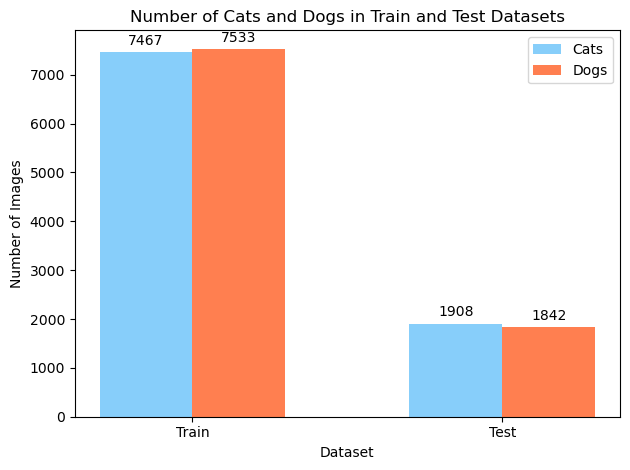

In [ ]:
train_loader_for_counting = DataLoader(train_dataset, batch_size=256, num_workers=4, shuffle=False)
test_loader_for_counting = DataLoader(test_dataset, batch_size=256, num_workers=4, shuffle=False)

train_counts = get_class_distribution(train_loader_for_counting)
test_counts = get_class_distribution(test_loader_for_counting)

labels = ['Train', 'Test']
cats_counts = [train_counts[0], test_counts[0]]
dogs_counts = [train_counts[1], test_counts[1]]

x = np.arange(len(labels))
width = 0.3

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, cats_counts, width, label='Cats',color=colors[0])
rects2 = ax.bar(x + width/2, dogs_counts, width, label='Dogs',color=colors[1])

ax.set_xlabel('Dataset')
ax.set_ylabel('Number of Images')
ax.set_title('Number of Cats and Dogs in Train and Test Datasets')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

autolabel(rects1,ax)
autolabel(rects2,ax)

fig.tight_layout()

plt.show()


As can be seen, we have an almost equal dataset of train and test.

# Part 1 - Classification of the Raw Data

In the first part of the project, we will evaluate our models on the raw data without any permutations, and check the results, to make sure those models bring good results and are suitable for this task.

We will start with the Resnet50 model and later present the ViT model.

## ResNet50

In [ ]:
model_name='resnet50'

### Train

In [ ]:
model = define_model(model_name, train_dir)

train_loader, test_loader, val_loader = get_datasets(model_name, train_dir, test_dir, train_transform=transform, test_transform=transform, batch_size=batch_size, num_workers=num_workers)

model = train_model(train_loader, val_loader=val_loader, num_epochs=num_epochs, batch_size=batch_size, learning_rate=learning_rate,
                    desired_image_size=desired_image_size, model_name=model_name, num_tiles=num_tiles, seed=seed,
                    hypothesis_description=hypothesis_description, model_path=None, model = model)

### Predict


In [ ]:
df_model_metrics, conf_matrix = evaluate_model_and_get_metrics(model, test_loader, model_name=model_name, seed=seed, num_tiles=num_tiles, hypothesis_description=hypothesis_description)

100%|██████████| 118/118 [00:16<00:00,  7.26it/s]


### Evaluation



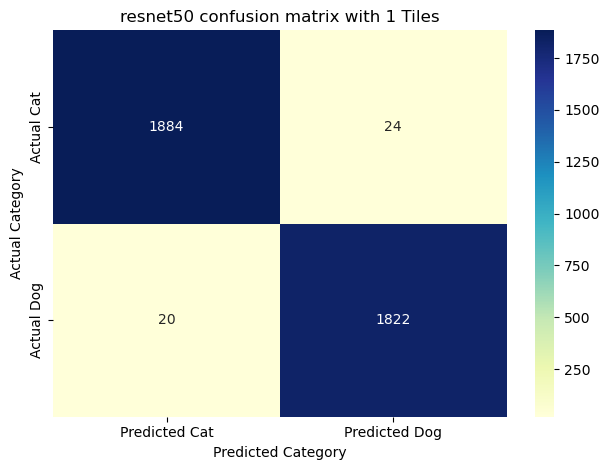

In [ ]:
conf_matrix_df = pd.DataFrame(conf_matrix, columns=['Predicted Cat', 'Predicted Dog'], index=['Actual Cat', 'Actual Dog'])
plot_confusion_matrix(conf_matrix_df, num_tiles, model_name)


It can be seen that we received quite good results -

1. **Accuaracy** - Measures the proportion between currect labelings to the total number of samples.
<br>

$$
\text{Accuracy} = \frac{TP + TN}{TP + TN + FP + FN}
$$


<br>


2.   **Presicion** - The number of true positives divided by the total number of all *predicted* positives.
<br>

$$
\text{Precision} = \frac{TP}{TP + FP}
$$
<br>

3. **Recall** - The number of true positives divided by the total number of all *actual* positives.
<br>


$$
\text{Recall} = \frac{TP}{TP + FN}
$$

<br>

4. **F1 Score** - A metric used to evaluate binary classification models by combining precision and recall into a single value. The F1 score balances both aspects, making it useful for assessing model performance.


$$
F_1 = 2\cdot\frac{\text{precision}\cdot\text{recall}}{\text{precision}+\text{recall}}
$$
<br>

We chose to focus on analysing the *Accuracy* metric only becasue we are dealing with classificaiton problem with 2 classes. The *Precision* and *Recall* focus only on "True Positives" of the toal positives and total "Trues", respectively. Thus, they miss the model's performances on the "False" side. Hence, we chose to focus on the *Accuracy* metric, to capture the model's performances on both dogs and cats.

### Displaying random images of raw data with the model prediction

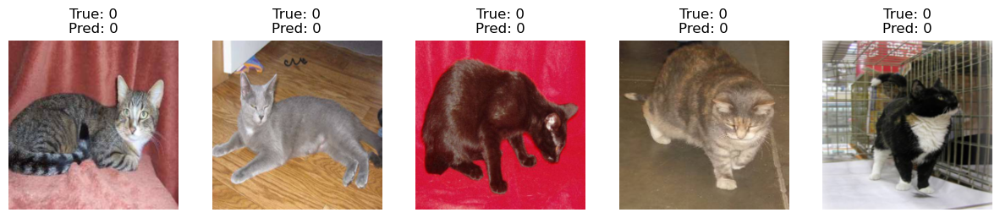

In [ ]:
display_images_and_predictions(model, test_loader,model_name='resnet50')

## Vision Transformer (ViT)

In [ ]:
model_name='vit'

#### Train

In [ ]:
model_vit = define_model(model_name, train_dir)

train_loader, test_loader, val_loader = get_datasets(model_name, train_dir, test_dir, train_transform=transform, test_transform=transform, batch_size=batch_size, num_workers=num_workers)

model_vit = train_model(train_loader, val_loader=val_loader, num_epochs=num_epochs, batch_size=batch_size, learning_rate=learning_rate,
                    desired_image_size=desired_image_size, model_name=model_name, num_tiles=num_tiles, seed=seed,
                    hypothesis_description=hypothesis_description, model_path=None, model = model_vit)

### Predict

In [ ]:
df_model_metrics, conf_matrix = evaluate_model_and_get_metrics(
    model_vit,
    test_loader,
    model_name=model_name,
    seed=seed,
    num_tiles=num_tiles,
    hypothesis_description=hypothesis_description
)

100%|██████████| 118/118 [00:22<00:00,  5.27it/s]


### Evaluation

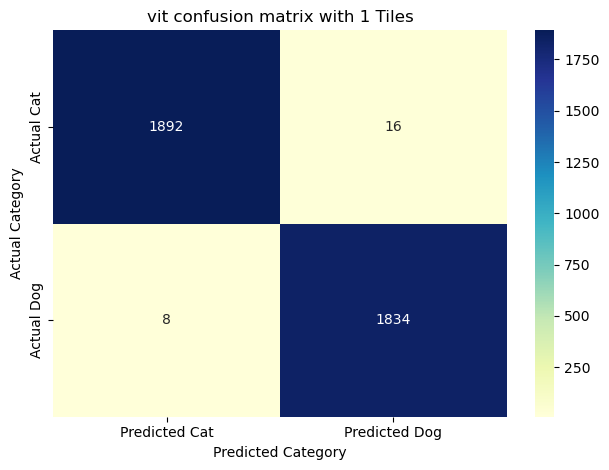

In [ ]:
conf_matrix_df = pd.DataFrame(conf_matrix, columns=['Predicted Cat', 'Predicted Dog'], index=['Actual Cat', 'Actual Dog'])
plot_confusion_matrix(conf_matrix_df, num_tiles, model_name)

### Displaying random images of raw data with the model prediction

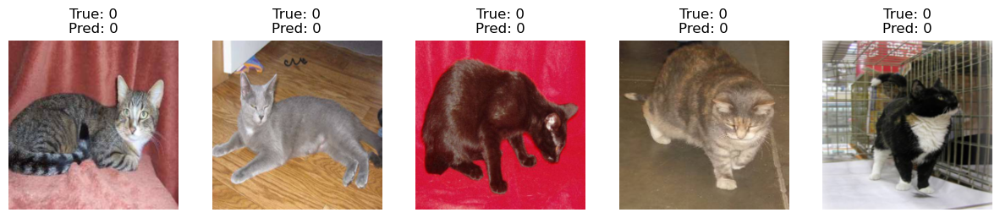

In [ ]:
display_images_and_predictions(model_vit, test_loader,model_name='vit')

# Part 2 - Classification of Permuted Images (Answering research questions)

## Data Preparation - creating permuted images

Firstly we will create the dataset with the permuted images. We will do that for differet number of tiles (2, 3, 4, 7, 10, 12) and for different seed values (1, 2, 3). We took a wide range of possible tiles to see significant differences between the values.

The permutation function will make identical permutation for all images under the same seed value. In other words, if seed=2 under 2x2 image will take the top-right corner image and replace it with the top-left one, that will be the change/shuffle for all images in the dataset under this run.

In [ ]:
permuted_train_tiles_seeds_paths = {}

In [ ]:
# create permuted images
num_tiles_values = [2, 3, 4 ,7, 10, 12]
global_seed_values = [1, 2, 3]
models_names_values = ['resnet50','vit']

directories = [train_dir, test_dir]

for directory in directories:
  for num_tiles in num_tiles_values:
      for seed in global_seed_values:
          permuted_train_tiles_seeds_paths = permute_images(directory , num_tiles=num_tiles, seed=seed,permuted_train_tiles_seeds_paths=permuted_train_tiles_seeds_paths)
          print(f'directory {directory}_permuted_seed{seed}_tiles{num_tiles} was created')

directory train_dataset_directory_permuted_seed1_tiles2 was created
directory train_dataset_directory_permuted_seed2_tiles2 was created
directory train_dataset_directory_permuted_seed3_tiles2 was created
directory train_dataset_directory_permuted_seed1_tiles3 was created
directory train_dataset_directory_permuted_seed2_tiles3 was created
directory train_dataset_directory_permuted_seed3_tiles3 was created
directory train_dataset_directory_permuted_seed1_tiles4 was created
directory train_dataset_directory_permuted_seed2_tiles4 was created
directory train_dataset_directory_permuted_seed3_tiles4 was created
directory train_dataset_directory_permuted_seed1_tiles7 was created
directory train_dataset_directory_permuted_seed2_tiles7 was created
directory train_dataset_directory_permuted_seed3_tiles7 was created
directory train_dataset_directory_permuted_seed1_tiles10 was created
directory train_dataset_directory_permuted_seed2_tiles10 was created
directory train_dataset_directory_permuted_see

Displaying original image vs a random permutation

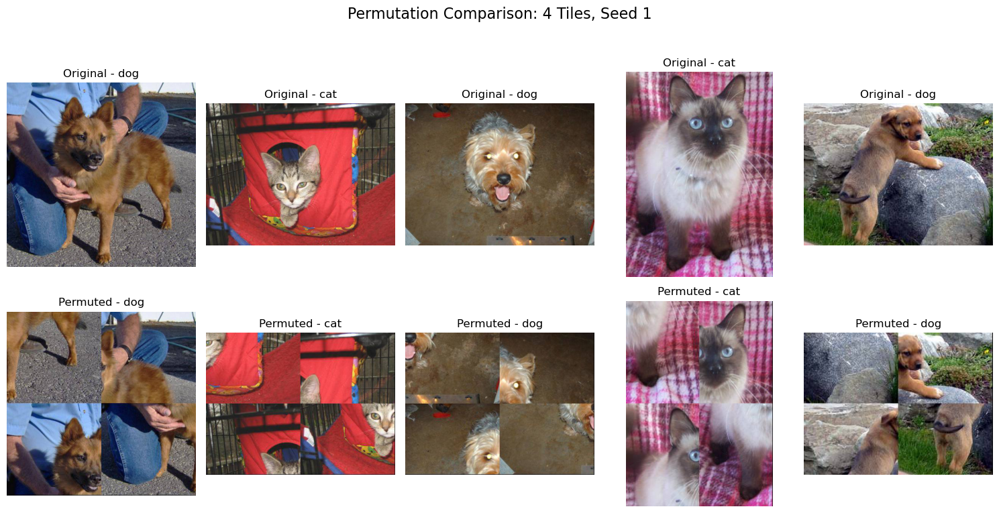

In [ ]:
example_num_tiles = num_tiles_values[0]
example_seed = global_seed_values[0]

example_path = get_permuted_path(test_dir, seed=example_seed, num_tiles=example_num_tiles,permuted_train_tiles_seeds_paths=permuted_train_tiles_seeds_paths)

show_original_vs_permuted_images(test_dir, 5, example_path,seed=example_seed, num_tiles=example_num_tiles)

## Hypothesis 1 - Accuracy vs number of tiles

In the following hypothesis we experiment on training and testing on a variety of permutation and establish a baseline on permuted images classification.

The models we train and test in this section will be used as our baseline for future sections.

In [ ]:
seed_values = global_seed_values
num_tiles_list = num_tiles_values
models_names = models_names_values
hypothesis_description = 'q1'

In [ ]:
# Loop over each combination of seed and num_tiles and train and evaluate models
for model_name in models_names:
    for seed in seed_values:
        for num_tiles in num_tiles_list:

            train_dir = get_permuted_path('train_dataset_directory', seed=seed, num_tiles=num_tiles,permuted_train_tiles_seeds_paths=permuted_train_tiles_seeds_paths)
            test_dir = get_permuted_path('test_dataset_directory', seed=seed, num_tiles=num_tiles,permuted_train_tiles_seeds_paths=permuted_train_tiles_seeds_paths)

            print(f"Training from directory: {train_dir}")
            train_loader, test_loader, val_loader = get_datasets(model_name, train_dir, test_dir, train_transform=transform, test_transform=transform, batch_size=batch_size, num_workers=num_workers)

            model = define_model(model_name, train_dir)
            model = train_model(
                train_loader=train_loader,
                val_loader=val_loader,
                num_epochs=num_epochs,
                batch_size=batch_size,
                learning_rate=learning_rate,
                desired_image_size=desired_image_size,
                model_name=model_name,
                num_tiles=num_tiles,
                seed=seed,
                hypothesis_description=hypothesis_description,
                model_path=None,
                model = model
                )

            print('-------------------------------')
            print(f"Evaluating from directory: {test_dir}")

            # Evaluate the model
            metrics_df, conf_matrix = evaluate_model_and_get_metrics(
                model=model,
                test_loader=test_loader,
                model_name=model_name,
                seed=seed,
                num_tiles=num_tiles,
                hypothesis_description=hypothesis_description
            )

            # Output the results for this iteration
            # print(f"Results for Seed: {seed}, Num Tiles: {num_tiles}")
            # print(metrics_df)
            # print(conf_matrix)
            print('-------------------------------')


Ploting the average accuracy across different number of tiles.

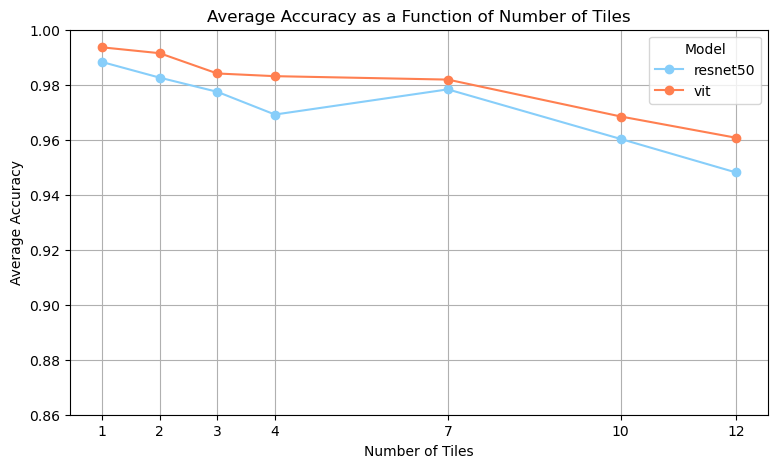

In [ ]:
# Filter the DataFrame to include only specific Hypothesis Descriptions
filtered_df = df_model_metrics[df_model_metrics['Hypothesis Description'].isin(['classic_image_classification', 'q1'])]

# Calculate the average accuracy for each number of tiles and model
average_accuracies = filtered_df.groupby(['Num Tiles', 'Model'])['Accuracy'].mean().unstack()

plt.figure(figsize=(9, 5))
for i,model in enumerate(average_accuracies.columns):
    plt.plot(average_accuracies[model], label=model, marker='o',color=colors[i])

plt.title('Average Accuracy as a Function of Number of Tiles')
plt.xlabel('Number of Tiles')
plt.ylabel('Average Accuracy')
plt.xticks(average_accuracies.index)
plt.ylim(0.86, 1)  # Set the y-axis limit to show from 0.9 to 1 for clarity
plt.legend(title='Model')
plt.grid(True)

plt.show()

As can be seen above, as the number of tiles increases, the accuracy decreases dramatically. However, it is still quite high.

Plotting average *Recall*, *Precision* and *F1 Score* across different number of tiles.

In [ ]:
average_metrics_resnet = filtered_df[filtered_df['Model']=='resnet50'].groupby(['Num Tiles', 'Model'])[['Precision','Recall','F1-Score']].mean().unstack()
average_metrics_resnet = average_metrics_resnet.reset_index()
average_metrics_resnet.columns = average_metrics_resnet.columns.droplevel(1)
average_metrics_resnet = average_metrics_resnet.melt(id_vars='Num Tiles', var_name='Metric', value_name='Value')
average_metrics_resnet['Model'] = 'resnet50'

average_metrics_vit = filtered_df[filtered_df['Model']=='resnet50'].groupby(['Num Tiles', 'Model'])[['Precision','Recall','F1-Score']].mean().unstack()
average_metrics_vit = average_metrics_vit.reset_index()
average_metrics_vit.columns = average_metrics_vit.columns.droplevel(1)
average_metrics_vit = average_metrics_vit.melt(id_vars='Num Tiles', var_name='Metric', value_name='Value')
average_metrics_vit['Model'] = 'vit'

average_metrics = pd.concat([average_metrics_resnet, average_metrics_vit])

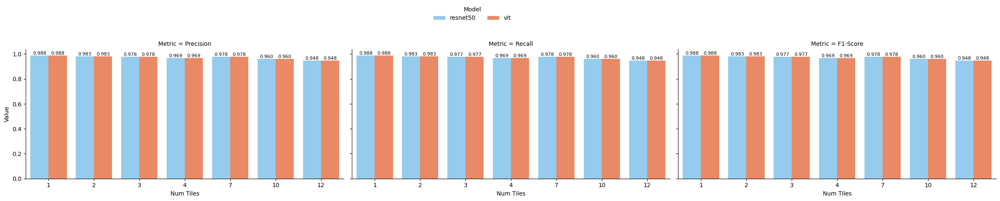

In [ ]:
g = sns.catplot(x='Num Tiles', y='Value', hue='Model', col='Metric', data=average_metrics, kind='bar', palette=custom_palette, height=4, aspect=2,legend=True)

# Add annotations for each bar
for ax in plt.gcf().axes:
  for p in ax.patches:
    if p.get_height() > 0:
      ax.annotate(f'{p.get_height():.3f}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom',fontsize=8)

sns.move_legend(g, "upper center", bbox_to_anchor=(0.45, 1.2), ncol=2)
plt.show()

As mentioned above since we only have 2 classes, *Dogs* and *Cats*, the 3 metrics, *Recall*, *Precision* and *F1 Score* are very similar to the *Accuracy*, we will only focus on *Accuracy* in the following sections.

### Hypothesis 1.5 - How well do the models understand the permutations

We want to test if the model can understand a specific permutation or if the model identifies different features in general regardless of the permutation.

For example if the model searches for a specific charecteristic i.e. a cat's eye in any location then the model doesn't fully understand the specific permutation and will give similar results for other permutation (with the same number of tiles).

In [ ]:
num_tiles_list = num_tiles_values
train_seeds = [1]
test_seeds = global_seed_values
models_names = models_names_values

seeds = [(train_seed,test_seed) for train_seed in train_seeds for test_seed in test_seeds]

hypothesis_description = 'q1.5'

In [ ]:
# Evaluation only
for model_name in models_names:
    for train_seed, test_seed in seeds:
        for num_tiles in num_tiles_list:

            train_dir = get_permuted_path('train_dataset_directory', seed=train_seed, num_tiles=num_tiles,permuted_train_tiles_seeds_paths=permuted_train_tiles_seeds_paths)
            test_dir = get_permuted_path('test_dataset_directory', seed=test_seed, num_tiles=num_tiles,permuted_train_tiles_seeds_paths=permuted_train_tiles_seeds_paths)

            print(f"Training from directory: {train_dir}")

            train_loader, test_loader, val_loader = get_datasets(model_name, train_dir, test_dir, train_transform=transform, test_transform=transform, batch_size=batch_size, num_workers=num_workers)

            model = define_model(model_name, train_dir)

            # This will only load the trained model
            model = train_model(
                train_loader=train_loader,
                val_loader=val_loader,
                num_epochs=num_epochs,
                batch_size=batch_size,
                learning_rate=learning_rate,
                desired_image_size=desired_image_size,
                model_name=model_name,
                num_tiles=num_tiles,
                seed=train_seed,
                hypothesis_description='q1',
                model_path=None,
                model = model
                )


            print('-------------------------------')
            print(f"Evaluating from directory: {test_dir}")

            if test_seed == train_seed:
                same_seed = True
            else:
                same_seed = False

            # Evaluate the model
            metrics_df, conf_matrix = evaluate_model_and_get_metrics(
                model=model,
                test_loader=test_loader,
                model_name=model_name,
                seed=train_seed,
                num_tiles=num_tiles,
                hypothesis_description=hypothesis_description + f'_same_seed_{same_seed}_test_seed_{test_seed}'
            )

            # Output the results for this iteration
            # print(f"Results for Seed: {seed}, Num Tiles: {num_tiles}")
            # print(metrics_df)
            # print(conf_matrix)
            print('-------------------------------')


Plot the average accuracies for Train + Test models vs Test only models (trained on a different permutation with the same number of tiles)

The following graph shows the accuracy for both models, in two different variations:

1. Baseline - Trained and tested on a specific permuted data.
2. Not Baseline - Trained on the same specific permuted data <ins>but</ins> tested on a different permutation.

In [ ]:
local_df = df_model_metrics.copy()
local_df = local_df[local_df['Hypothesis Description'].str.contains('q1.5')]
local_df['Baseline'] = local_df['Hypothesis Description'].str.contains('same_seed_True')
local_df_avg = local_df.groupby(['Num Tiles', 'Model', 'Baseline'])['Accuracy'].mean().unstack()
local_df_avg = local_df_avg.melt(ignore_index=False).reset_index()


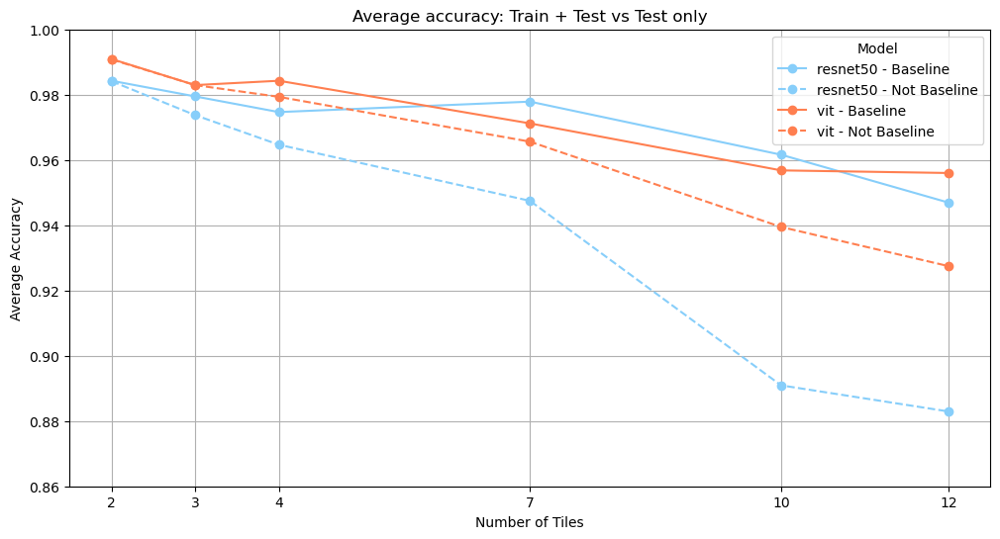

In [ ]:
plt.figure(figsize=(12, 6))

for i, model in enumerate(local_df_avg['Model'].unique()):
    df_tmp = local_df_avg[(local_df_avg['Model'] == model) & (local_df_avg['Baseline'] == True)]
    plt.plot(df_tmp['Num Tiles'], df_tmp['value'], label=f'{model} - Baseline', marker='o', color=colors[i])
    df_tmp = local_df_avg[(local_df_avg['Model'] == model) & (local_df_avg['Baseline'] == False)]
    plt.plot(df_tmp['Num Tiles'], df_tmp['value'], label=f'{model} - Not Baseline', marker='o', linestyle='--', color=colors[i])

plt.title('Average accuracy: Train + Test vs Test only')
plt.xlabel('Number of Tiles')
plt.ylabel('Average Accuracy')
plt.xticks(local_df_avg['Num Tiles'].unique())  # Ensure that x-ticks match the number of tiles
plt.ylim(0.86, 1)  # Set the y-axis limit to show from 0.9 to 1 for clarity
plt.legend(title='Model')
plt.grid(True)

plt.show()

As seen in the above graph, we can see that for the test only the accuracy is much lower compared to the trained model. The results are still quite high which implies the model does in fact learn some general characteristics in addition to the specific permutation.


## Hypothesis 2 - Accuracy vs Permutation Complexity

### Image Permutation Complexity

We define an Image Permutation Complexity function:

It is composed from 2 different scores:

1. displacement_score - The sum of all distances each tile moved from the permutation.
2. neighbour_displacement_score - Sum of all cardinal neighbours in the permuted image that were not neighbours (in the same direction) in the original image times a constant.

We can use all available distance_metrics from scipy, and set any constant for the neighbour_displacement_score

### Complexity Functions

In [ ]:
def calculate_displacement_score(N,new_order,distance_metric):
    new_order = transpose_permutation(new_order)
    orig_indices = np.zeros((2,N**2))
    for i in range(N):
        for j in range(N):
            orig_indices[0,i*N+j] = i
            orig_indices[1,i*N+j] = j

    new_indices = orig_indices[:,new_order]

    return np.trace(cdist(orig_indices.T,new_indices.T,metric=distance_metric))

In [ ]:
def calculate_neighbor_displacement_score(N,new_order,cost_per_bad_neighbour):
    new_order = transpose_permutation(new_order)
    orig_indices = np.zeros((2,N**2))
    for i in range(N):
        for j in range(N):
            orig_indices[0,i*N+j] = i
            orig_indices[1,i*N+j] = j

    new_indices = orig_indices[:,new_order]

    # reshape to be NxN size with 2 channels for row and column in the original matrix
    new_indices_reshaped = new_indices.T.reshape(N,N,2)

    cost = 0
    for row in range(N):
        for col in range(N):
            curr_new_index = new_indices_reshaped[row,col]

            # Since the value in new_indices_reshaped[row,col] is a 2d vector with the original indices
            # if we subtract 1 from the 1st dimension in that value we will get the index of the neighbour above in the original image
            # so we check if the new neighbour was also a neighbour in the past.
            if row-1 >=0:
                u_neigh = new_indices_reshaped[row-1,col]
                if not (u_neigh[0]==curr_new_index[0]-1 and u_neigh[1]==curr_new_index[1]):
                    cost+=1*cost_per_bad_neighbour

            if row+1 < N:
                d_neigh = new_indices_reshaped[row+1,col]
                if not (d_neigh[0]==curr_new_index[0]+1 and d_neigh[1]==curr_new_index[1]):
                    cost+=1*cost_per_bad_neighbour

            if col-1 >=0:
                l_neigh = new_indices_reshaped[row,col-1]
                if not (l_neigh[0]==curr_new_index[0] and l_neigh[1]==curr_new_index[-1]-1):
                    cost+=1*cost_per_bad_neighbour

            if col+1 < N:
                r_neigh = new_indices_reshaped[row,col+1]
                if not (r_neigh[0]==curr_new_index[0] and r_neigh[1]==curr_new_index[1]+1):
                    cost+=1*cost_per_bad_neighbour

    return cost

In [ ]:
def calculate_total_displacement_score(N,order,cost_per_bad_neigbour,distance_metric):
    return calculate_displacement_score(N,order,distance_metric) + calculate_neighbor_displacement_score(N,order,cost_per_bad_neigbour)

In [ ]:
def add_complexity_score(df,cost_per_bad_neighbour=3,distance_metric='euclidean'):
    df['Complexity'] = 0
    for idx,row in df.iterrows():
        N = int(row['Num Tiles'])
        seed = int(row['Seed'])
        np.random.seed(seed)
        order = np.random.permutation(N**2)
        df.loc[idx,'Complexity'] = calculate_total_displacement_score(N,order,cost_per_bad_neighbour,distance_metric)

    return df

We chose to use euclidean distance and cost_per_bad_neighbour=3. These parameters felt reasonable for human eyes.

In [ ]:
cost_per_bad_neighbour = 3
distance_metric = 'euclidean'

#### Complexity example

Let's see a few examples of different permutation and how their complexity score compares to our human intuition of complex images.
0. Original image
1. Swap columns
3. Swap rows
4. Swap 2x2 blocks
5. Swap opposite corners but keep 2x1 blocks
6. Random
7. Traspose
8. Reverse order

In [ ]:
image_path = os.path.join('train_dataset_directory','dog',os.listdir(os.path.join(train_dir,'dog'))[165])
image = Image.open(image_path)

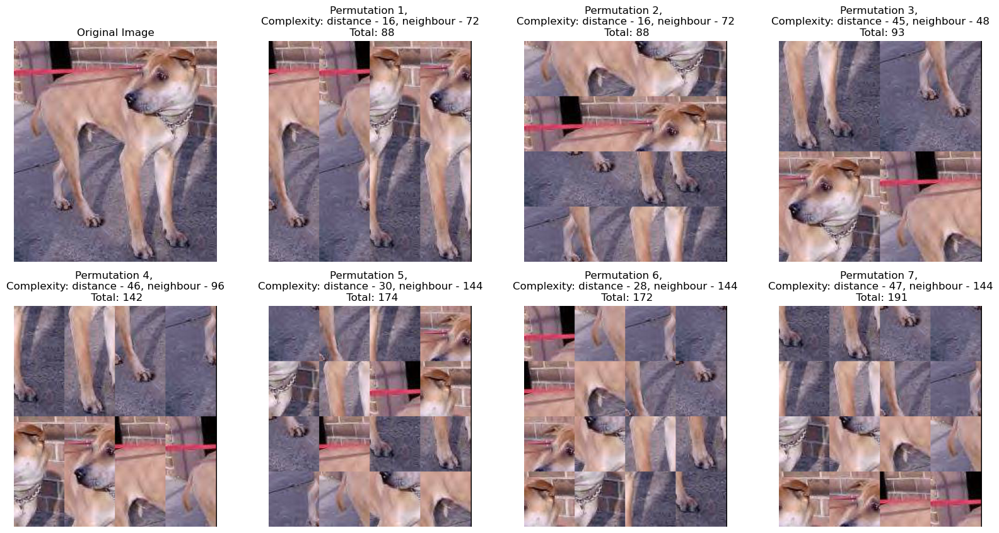

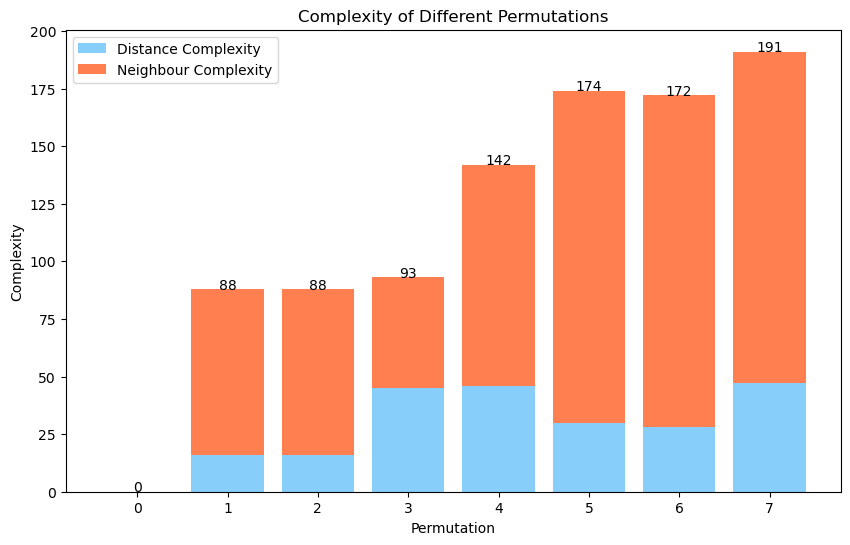

In [ ]:
# create a few custom permutations

perm_1 = [4,5,6,7,0,1,2,3,12,13,14,15,8,9,10,11] # swap cols
perm_2 = [1,0,3,2,5,4,7,6,9,8,11,10,13,12,15,14] # swap rows
perm_3 = [10,11,8,9,14,15,12,13,2,3,0,1,6,7,4,5] # swap 2x2 blocks
perm_4 = [14,15,12,13,10,11,8,9,6,7,4,5,2,3,0,1] # move opposite corners but keep as 2x1 blocks
np.random.seed(1)
perm_5 = np.random.permutation(16) # random
perm_6 = [0,4,8,12,1,5,9,13,2,6,10,14,3,7,11,15] # transpose
perm_7 = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15][::-1] # reverse order

permutations = [perm_1,perm_2,perm_3,perm_4,perm_5,perm_6,perm_7]
permutations = [transpose_permutation(perm) for perm in permutations]

distance_complexity = [int(calculate_displacement_score(4,perm,distance_metric=distance_metric)) for perm in permutations]
neighbour_complexity = [calculate_neighbor_displacement_score(4,perm,cost_per_bad_neighbour=cost_per_bad_neighbour) for perm in permutations]
total_complexity = [distance_complexity[i]+neighbour_complexity[i] for i in range(7)]

permuted_images = [shuffle_tiles_single_image(image,perm) for perm in permutations]

f,ax = plt.subplots(2,4,figsize=(20,10))

ax[0,0].imshow(image)
ax[0,0].set_title('Original Image')
ax[0,0].axis('off')

for i in range(1,8):
    ax[i//4,i%4].imshow(permuted_images[i-1])
    ax[i//4,i%4].set_title(f'Permutation {i}, \nComplexity: distance - {distance_complexity[i-1]}, neighbour - {neighbour_complexity[i-1]}\n Total: {total_complexity[i-1]}')
    ax[i//4,i%4].axis('off')
plt.show()

f,ax = plt.subplots(figsize=(10,6))
plt.bar(range(8),[0] + distance_complexity,label='Distance Complexity',color=colors[0])
plt.bar(range(8),[0] + neighbour_complexity,bottom=[0]+distance_complexity,label='Neighbour Complexity',color=colors[1])

for i, count in enumerate([0]+total_complexity):
    plt.text(i, count, str(count), ha='center')

plt.xticks(range(8),['0','1','2','3','4','5','6','7'])
plt.xlabel('Permutation')
plt.ylabel('Complexity')
plt.title('Complexity of Different Permutations')
plt.legend()
plt.show()

### Accuracy vs Complexity

In [ ]:
df_model_metrics = add_complexity_score(df_model_metrics,cost_per_bad_neighbour=cost_per_bad_neighbour,distance_metric=distance_metric)

<Figure size 1000x600 with 0 Axes>

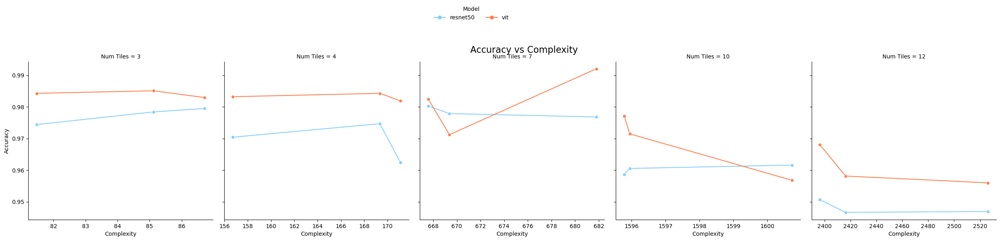

In [ ]:
df_model_metrics_local = df_model_metrics[df_model_metrics['Hypothesis Description']=='q1']
df_model_metrics_local = df_model_metrics_local[df_model_metrics_local['Num Tiles']>2]

plt.figure(figsize=(10,6))
g = sns.relplot(data=df_model_metrics_local,x='Complexity',y='Accuracy',hue='Model',col='Num Tiles',marker='o',kind='line',palette=custom_palette,facet_kws={'sharey': True, 'sharex': False})
g.figure.suptitle('Accuracy vs Complexity', fontsize=16)
g.figure.subplots_adjust(top=0.9)
sns.move_legend(g, "upper center", bbox_to_anchor=(0.45, 1.2), ncol=2)
plt.show()

As can be seen from the above graph, there is a slight downwards trend, the higher the complexity the lower the accuracy. There are some outliers (in Num Tiles=7, for vit).

For a clearer and more significant trend we need to train models on a larger range of seed values, which is out of scope for this project due to computing power and time frame limitation.

## Hypothesis 3 - Using ML/DL techniques will improve the results of permuted images predictions

### Method 1 - Adding Dropout



Dropout is a regularization technique used to prevent overfitting in neural networks by randomly dropings out (i.e. setting to zero) a number of weights in the neural network. This means that in each batch a subset of neurons does not activate, which forces the network to use only the other neurons. The overall training process makes the model to focus more robust features. At test time, dropout is not applied. Instead, neuron outputs are scaled down by the dropout rate to balance the fact that more neurons are active than during training.

<br>

**General Motivation**

In general, dropout reduces the likelihood of the network overfitting by making it less sensitive to the specific weights of individual neurons.

Dropout is straightforward to implement: you add a Dropout layer to your neural network architecture.
Despite its simplicity, it has been shown to be highly effective in improving generalization.

<br>

**Our motivation and intuition** for using dropout in our project can be understood using the following example:

An extreme case of a dropout layer can be zeroing out all of the neurons related to the top half of our image, and expecting the model to be able to correctly classfiy the image using only the neurons related to the bottom half of out image.

In our case of permuted images we would like the model to be able to classify the image based on each tile independently.

In [ ]:
seed_values = global_seed_values
num_tiles_list = num_tiles_values
models_names = models_names_values
hypothesis_description = 'q3_dropout_v2'

In [ ]:
for model_name in models_names:
    for seed in seed_values:
        for num_tiles in num_tiles_list:
            train_dir = get_permuted_path('train_dataset_directory', seed=seed, num_tiles=num_tiles,permuted_train_tiles_seeds_paths=permuted_train_tiles_seeds_paths)
            test_dir = get_permuted_path('test_dataset_directory', seed=seed, num_tiles=num_tiles,permuted_train_tiles_seeds_paths=permuted_train_tiles_seeds_paths)

            print(f"Training from directory: {train_dir}")

            train_loader, test_loader, val_loader = get_datasets(model_name, train_dir, test_dir, train_transform=transform, test_transform=transform, batch_size=batch_size, num_workers=num_workers)

            model = define_model(model_name, train_dir)
            model = add_dropout(model, dropout_rate=0.5, model_name = model_name)
            model = train_model(
                train_loader=train_loader,
                val_loader=val_loader,
                num_epochs=num_epochs,
                batch_size=batch_size,
                learning_rate=learning_rate,
                desired_image_size=desired_image_size,
                model_name=model_name,
                num_tiles=num_tiles,
                seed=seed,
                hypothesis_description=hypothesis_description,
                model_path=None,
                model = model,
                dropout=True
                )


            print('-------------------------------')
            print(f"Evaluating from directory: {test_dir}")

            metrics_df, conf_matrix = evaluate_model_and_get_metrics(
                model=model,
                test_loader=test_loader,
                model_name=model_name,
                seed=seed,
                num_tiles=num_tiles,
                hypothesis_description=hypothesis_description
            )

            # print(f"Results for Seed: {seed}, Num Tiles: {num_tiles}")
            # print(metrics_df)
            # print(conf_matrix)
            print('-------------------------------')

In [ ]:
q1_q3_dropout_df = df_model_metrics[df_model_metrics['Hypothesis Description'].isin(['q1', 'q3_dropout_v2'])]
q1_q3_dropout_df.drop(columns=['Complexity'], inplace=True)

In [ ]:
q1_q3_dropout_df['Num Tiles'] = q1_q3_dropout_df['Num Tiles'].astype(int)
q1_q3_dropout_df['Seed'] = q1_q3_dropout_df['Seed'].astype(int)

#### Resntet50 and ViT Metrics Comparision

In [ ]:
resnet50_filtered_df = q1_q3_dropout_df[(q1_q3_dropout_df['Model'] == 'resnet50')]
vit_filtered_df = q1_q3_dropout_df[(q1_q3_dropout_df['Model'] == 'vit')]

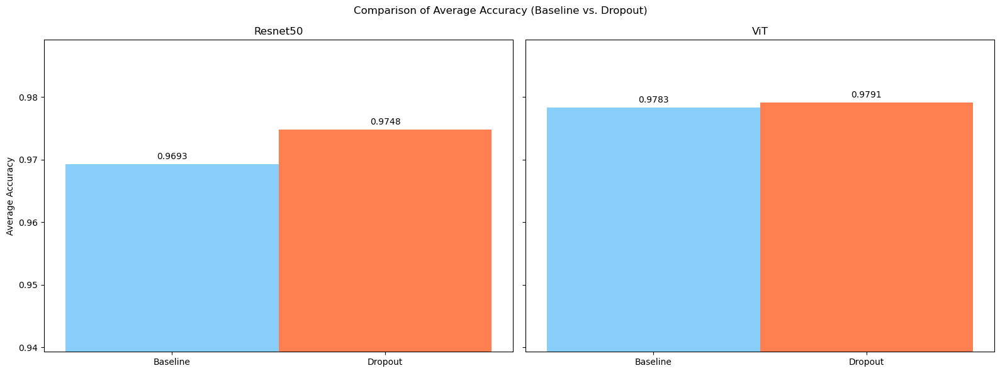

In [ ]:
average_accuracy_resnet = resnet50_filtered_df.groupby('Hypothesis Description')['Accuracy'].mean()
average_accuracy_vit = vit_filtered_df.groupby('Hypothesis Description')['Accuracy'].mean()

f, ax = plt.subplots(1,2, figsize=(16, 6),sharey=True)

x_resnet = average_accuracy_resnet.index
y_resnet = average_accuracy_resnet.values
# make the bars closer to each other
bar_width = 0.5

ax[0].bar([0,0.5], y_resnet, bar_width, color=colors)
ax[0].set_xticks([0,0.5], ['Baseline', 'Dropout'])

ax[0].set_ylabel('Average Accuracy')
ax[0].set_title('Resnet50')

# Display average accuracy values above the bars
for i, acc in enumerate(y_resnet):
    ax[0].text(i/2, acc + 0.0005, f'{acc:.4f}', ha='center', va='bottom')

x_vit = average_accuracy_vit.index
y_vit = average_accuracy_vit.values

ax[1].bar([0,0.5], y_vit, bar_width, color=colors)
ax[1].set_xticks([0,0.5], ['Baseline', 'Dropout'])

ax[1].set_title('ViT')

# Display average accuracy values above the bars
for i, acc in enumerate(y_vit):
    ax[1].text(i/2, acc + 0.0005, f'{acc:.4f}', ha='center', va='bottom')

# Set y-axis limits based on the minimum and maximum average accuracy
min_y = min(min(y_vit),min(y_resnet))
max_y = max(max(y_vit),max(y_resnet))
ax[0].set_ylim(min_y - 0.03, max_y + 0.01)

f.suptitle('Comparison of Average Accuracy (Baseline vs. Dropout)')

plt.tight_layout()
plt.show()

As seen in the above graph, adding dropout to the resnet baseline model has slighly improve the average accuracy, while adding dropout to the vit baseline model has worsened the accuracy.

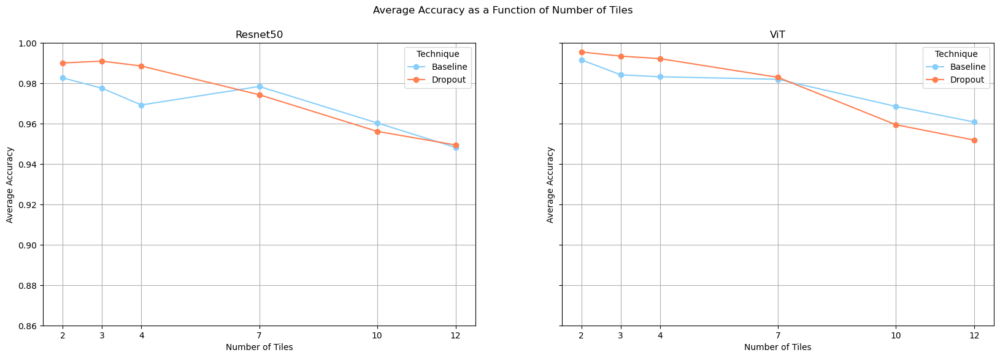

In [ ]:
# Calculate the average accuracy for each number of tiles and model
average_accuracies_resnet = resnet50_filtered_df.groupby(['Num Tiles', 'Hypothesis Description'])['Accuracy'].mean().unstack()
average_accuracies_resnet.columns = ['Baseline','Dropout']

average_accuracies_vit = vit_filtered_df.groupby(['Num Tiles', 'Hypothesis Description'])['Accuracy'].mean().unstack()
average_accuracies_vit.columns = ['Baseline','Dropout']

f, ax = plt.subplots(1,2, figsize=(20, 6),sharey=True)

for i,technique in enumerate(average_accuracies_resnet.columns):
    ax[0].plot(average_accuracies_resnet[technique], label=technique, marker='o',color=colors[i])

ax[0].set_title('Resnet50')
ax[0].set_xlabel('Number of Tiles')
ax[0].set_ylabel('Average Accuracy')
ax[0].set_xticks(average_accuracies_resnet.index)
ax[0].set_ylim(0.86, 1)  # Set the y-axis limit to show from 0.9 to 1 for clarity
ax[0].legend(title='Technique')
ax[0].grid(True)

for i,technique in enumerate(average_accuracies_vit.columns):
    ax[1].plot(average_accuracies_vit[technique], label=technique, marker='o',color=colors[i])

ax[1].set_title('ViT')
ax[1].set_xlabel('Number of Tiles')
ax[1].set_ylabel('Average Accuracy')
ax[1].set_xticks(average_accuracies_vit.index)
ax[1].set_ylim(0.86, 1)  # Set the y-axis limit to show from 0.9 to 1 for clarity
ax[1].legend(title='Technique')
ax[1].grid(True)

f.suptitle('Average Accuracy as a Function of Number of Tiles')

plt.show()

In both of our models the dropout improved our accuracy in number of tiles 2,3,4 but for larger number of tiles (7,10,12) our accuracy worsened.

This could be explained in that as the number of tiles increases the size of the tiles decreases causing the tiles to lose their meaning and the information they hold, for example spliting an eye/ear to 2 or more tiles will make the tiles lose their contextual information effectivaly becoming worthless. However the dropout layer will still try to use them for the classification leading to lower accuracy.

Changing the p value for the dropout layer could produce better results.

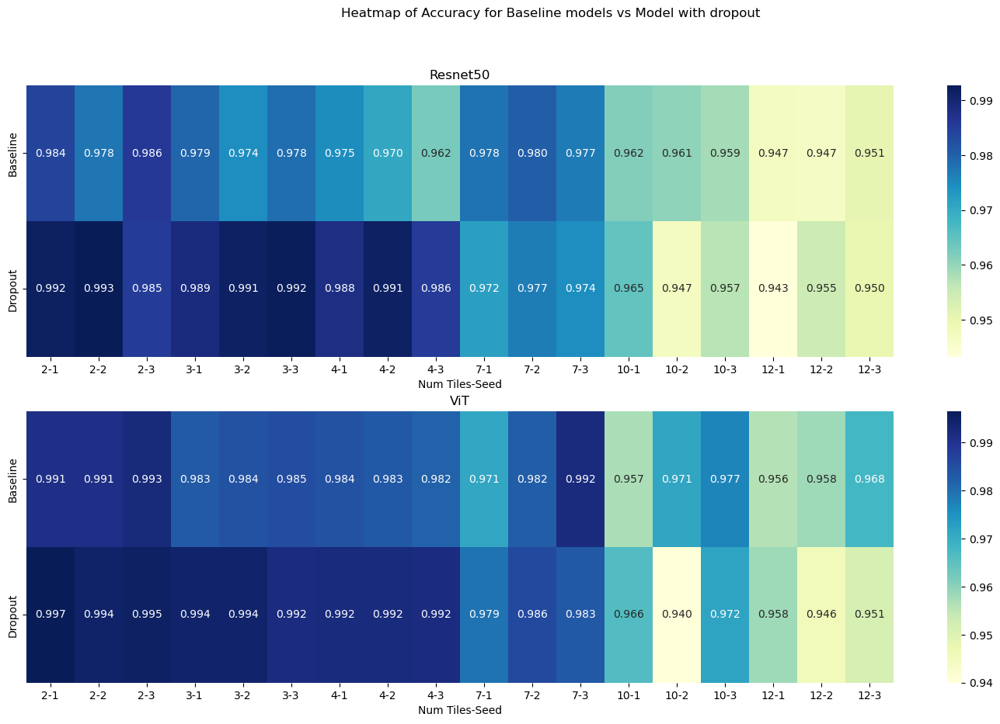

In [ ]:
pivot_table_resnet = resnet50_filtered_df.pivot_table(values='Accuracy', index='Hypothesis Description', columns=['Num Tiles', 'Seed'])
pivot_table_resnet.index = ['Baseline','Dropout']
pivot_table_vit = vit_filtered_df.pivot_table(values='Accuracy', index='Hypothesis Description', columns=['Num Tiles', 'Seed'])
pivot_table_vit.index = ['Baseline','Dropout']

f,ax = plt.subplots(2,1,figsize=(18,10))

sns.heatmap(pivot_table_resnet, annot=True,fmt='.3f', cmap='YlGnBu',ax=ax[0])
ax[0].set_title('Resnet50')

sns.heatmap(pivot_table_vit, annot=True,fmt='.3f', cmap='YlGnBu',ax=ax[1])
ax[1].set_title('ViT')

f.suptitle('Heatmap of Accuracy for Baseline models vs Model with dropout')
plt.show()

In the above heatmap we can see the same trends in both models, with specific results.

### Method 2 - Using Data Augmentation

**Data Augmentation** is a method in deep learning that helps improving the classification of images by applying various transformation to the training dataset. Those transformation can include: rotation, cropping, translation, scaling, flipping, normalizing the colors, etc.


**General Motivation**
Data augmentation better generalize the model by using larger and a more diverse training dataset. The augmentation also forces the model to learn more important features, since the transformation doesn't change the underlying features (for example an ear is still an ear even if we crop and flip it) the model need to learn to understand these features regardless of their position, scale and rotation.


**Our motivation and intuition** in our case of permuted images, the images are more complex and the image features are in unique positions, we want our model to better generalize and be able to identify the image features.

In [ ]:
seed_values = global_seed_values
num_tiles_list = num_tiles_values
models_names = models_names_values
hypothesis_description = 'q3_DA'

In [ ]:
augmented_train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

augmented_test_transform = transforms.Compose([
    transforms.Resize((desired_image_size, desired_image_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
for model_name in models_names:
    for seed in seed_values:
        for num_tiles in num_tiles_list:

            train_dir = get_permuted_path('train_dataset_directory', seed=seed, num_tiles=num_tiles,permuted_train_tiles_seeds_paths=permuted_train_tiles_seeds_paths)
            test_dir = get_permuted_path('test_dataset_directory', seed=seed, num_tiles=num_tiles,permuted_train_tiles_seeds_paths=permuted_train_tiles_seeds_paths)

            print(f"Training from directory: {train_dir}")

            train_loader, test_loader, val_loader = get_datasets(
                model_name,
                train_dir,
                test_dir,
                train_transform=augmented_train_transform,
                test_transform=augmented_test_transform,
                batch_size=batch_size, num_workers=num_workers)

            model = define_model(model_name, train_dir)
            model = train_model(
                train_loader=train_loader,
                val_loader=val_loader,
                num_epochs=num_epochs,
                batch_size=batch_size,
                learning_rate=learning_rate,
                desired_image_size=desired_image_size,
                model_name=model_name,
                num_tiles=num_tiles,
                seed=seed,
                hypothesis_description=hypothesis_description,
                model_path=None,
                model = model
                )


            print('-------------------------------')
            print(f"Evaluating from directory: {test_dir}")

            metrics_df, conf_matrix = evaluate_model_and_get_metrics(
                model=model,
                test_loader=test_loader,
                model_name=model_name,
                seed=seed,
                num_tiles=num_tiles,
                hypothesis_description=hypothesis_description
            )

            # print(f"Results for Seed: {seed}, Num Tiles: {num_tiles}")
            # print(metrics_df)
            # print(conf_matrix)
            print('-------------------------------')


In [ ]:
q1_q3_data_aug_df = df_model_metrics[df_model_metrics['Hypothesis Description'].isin(['q1', 'q3_DA'])]
q1_q3_data_aug_df.drop(columns=['Complexity'], inplace=True)

In [ ]:
q1_q3_data_aug_df['Num Tiles'] = q1_q3_data_aug_df['Num Tiles'].astype(int)
q1_q3_data_aug_df['Seed'] = q1_q3_data_aug_df['Seed'].astype(int)

#### Resntet50 and ViT Metrics Comparision

In [ ]:
resnet50_filtered_df = q1_q3_data_aug_df[(q1_q3_data_aug_df['Model'] == 'resnet50')]
vit_filtered_df = q1_q3_data_aug_df[(q1_q3_data_aug_df['Model'] == 'vit')]

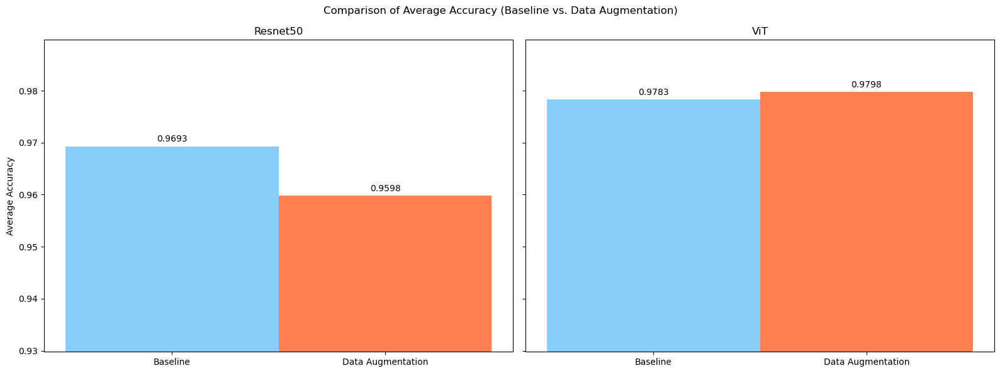

In [ ]:
average_accuracy_resnet = resnet50_filtered_df.groupby('Hypothesis Description')['Accuracy'].mean()
average_accuracy_vit = vit_filtered_df.groupby('Hypothesis Description')['Accuracy'].mean()

f, ax = plt.subplots(1,2, figsize=(16, 6),sharey=True)

x_resnet = average_accuracy_resnet.index
y_resnet = average_accuracy_resnet.values
# make the bars closer to each other
bar_width = 0.5

ax[0].bar([0,0.5], y_resnet, bar_width, color=colors)
ax[0].set_xticks([0,0.5], ['Baseline', 'Data Augmentation'])

ax[0].set_ylabel('Average Accuracy')
ax[0].set_title('Resnet50')

# Display average accuracy values above the bars
for i, acc in enumerate(y_resnet):
    ax[0].text(i/2, acc + 0.0005, f'{acc:.4f}', ha='center', va='bottom')

x_vit = average_accuracy_vit.index
y_vit = average_accuracy_vit.values

ax[1].bar([0,0.5], y_vit, bar_width, color=colors)
ax[1].set_xticks([0,0.5], ['Baseline', 'Data Augmentation'])

ax[1].set_title('ViT')

# Display average accuracy values above the bars
for i, acc in enumerate(y_vit):
    ax[1].text(i/2, acc + 0.0005, f'{acc:.4f}', ha='center', va='bottom')

# Set y-axis limits based on the minimum and maximum average accuracy
min_y = min(min(y_vit),min(y_resnet))
max_y = max(max(y_vit),max(y_resnet))
ax[0].set_ylim(min_y - 0.03, max_y + 0.01)

f.suptitle('Comparison of Average Accuracy (Baseline vs. Data Augmentation)')

plt.tight_layout()
plt.show()

As can be seen from the chart above, the *Data Augmentation* has improved the results for the ViT model but decreased the Accuracy for the Resnet50. In addition, the graph above only shows the total average of all expirements, both by seeds and number of tiles. To see that in more detail we should look at the following graph.

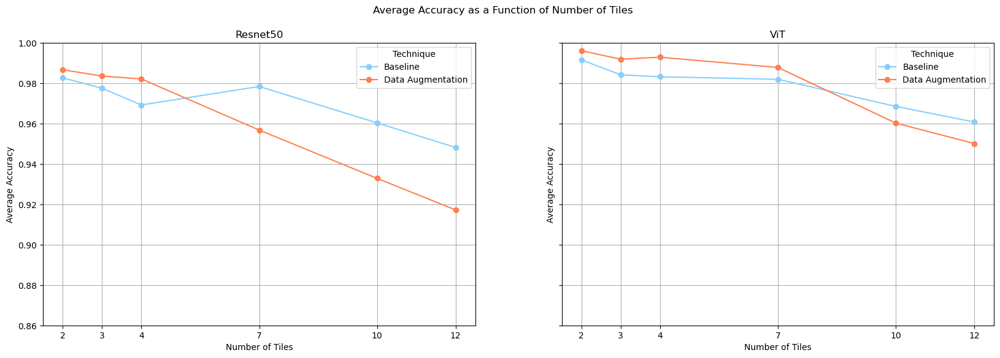

In [ ]:
# Calculate the average accuracy for each number of tiles and model
average_accuracies_resnet = resnet50_filtered_df.groupby(['Num Tiles', 'Hypothesis Description'])['Accuracy'].mean().unstack()
average_accuracies_resnet.columns = ['Baseline','Data Augmentation']

average_accuracies_vit = vit_filtered_df.groupby(['Num Tiles', 'Hypothesis Description'])['Accuracy'].mean().unstack()
average_accuracies_vit.columns = ['Baseline','Data Augmentation']

f, ax = plt.subplots(1,2, figsize=(20, 6),sharey=True)

for i,technique in enumerate(average_accuracies_resnet.columns):
    ax[0].plot(average_accuracies_resnet[technique], label=technique, marker='o',color=colors[i])

ax[0].set_title('Resnet50')
ax[0].set_xlabel('Number of Tiles')
ax[0].set_ylabel('Average Accuracy')
ax[0].set_xticks(average_accuracies_resnet.index)
ax[0].set_ylim(0.86, 1)  # Set the y-axis limit to show from 0.9 to 1 for clarity
ax[0].legend(title='Technique')
ax[0].grid(True)

for i,technique in enumerate(average_accuracies_vit.columns):
    ax[1].plot(average_accuracies_vit[technique], label=technique, marker='o',color=colors[i])

ax[1].set_title('ViT')
ax[1].set_xlabel('Number of Tiles')
ax[1].set_ylabel('Average Accuracy')
ax[1].set_xticks(average_accuracies_vit.index)
ax[1].set_ylim(0.86, 1)  # Set the y-axis limit to show from 0.9 to 1 for clarity
ax[1].legend(title='Technique')
ax[1].grid(True)

f.suptitle('Average Accuracy as a Function of Number of Tiles')

plt.show()

As can be seen in the graph above, data augmentation improves our results when number of tiles is 2,3,4, (and 7 in the ViT), but worsened our results when the number of tiles is high. The big difference in Resnet50 for 7,10,12 number of tiles explains the difference in the average accuracy bar graph.

The drop in accuracy for higher number of tiles can be caused by the fact that as the number of tiles increases, the tile size decreases and the image features become less recognizable, and one of the strengths of data augmentation which makes the model learn general features stops working.

In addition, we first create the permuted images and then augment the data. This can results in many "useless" tiles being in the augmented data.
A solution for this can be permuting the images only after augmenting the data.

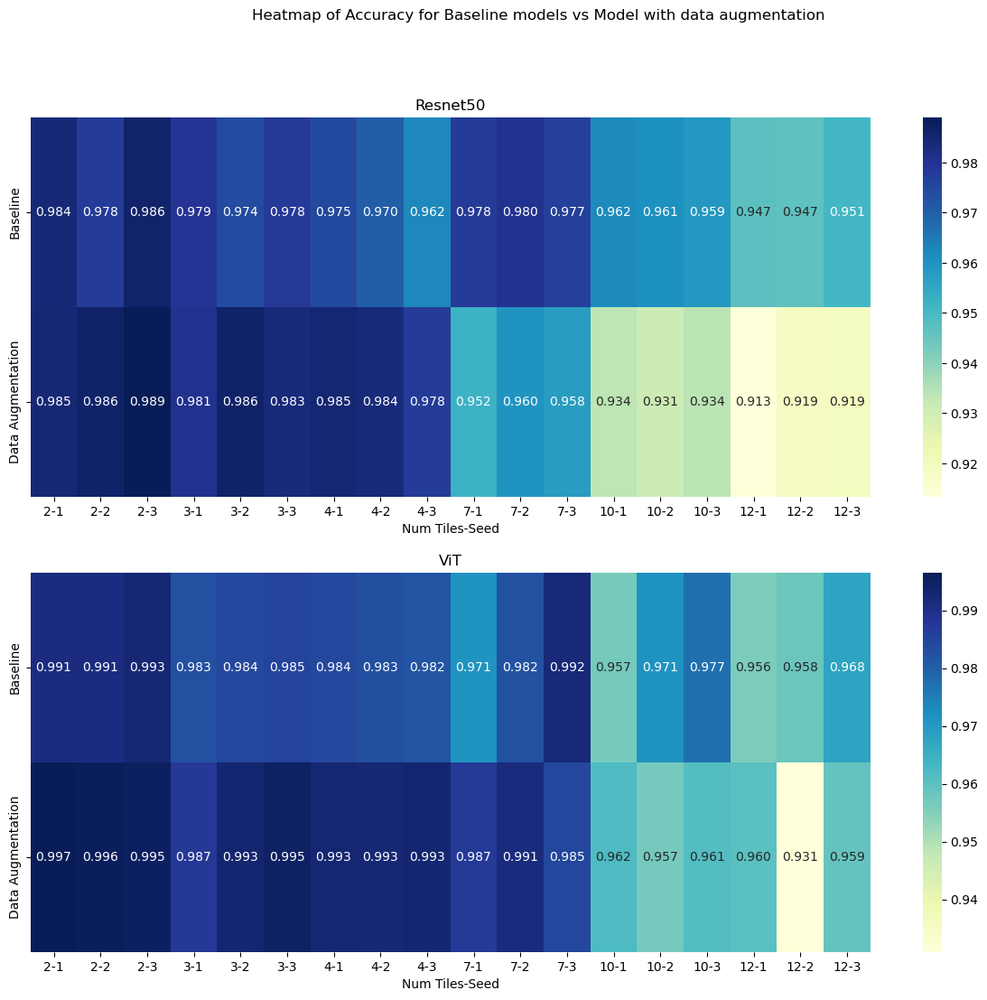

In [ ]:
pivot_table_resnet = resnet50_filtered_df.pivot_table(values='Accuracy', index='Hypothesis Description', columns=['Num Tiles', 'Seed'])
pivot_table_resnet.index = ['Baseline','Data Augmentation']
pivot_table_vit = vit_filtered_df.pivot_table(values='Accuracy', index='Hypothesis Description', columns=['Num Tiles', 'Seed'])
pivot_table_vit.index = ['Baseline','Data Augmentation']

f,ax = plt.subplots(2,1,figsize=(15,12))

sns.heatmap(pivot_table_resnet, annot=True,fmt='.3f', cmap='YlGnBu',ax=ax[0])
ax[0].set_title('Resnet50')

sns.heatmap(pivot_table_vit, annot=True,fmt='.3f', cmap='YlGnBu',ax=ax[1])
ax[1].set_title('ViT')

f.suptitle('Heatmap of Accuracy for Baseline models vs Model with data augmentation')
plt.show()

In the above heatmap we can see the same trends in both models, with specific results.

### Method 3 - Adding L1, L2 Regularizations

Regularization is a machine learning and deep learning technique that helps improving the model results by changing the weights in the model using some sort of penalty in turn helps in preventing overfitting and improving the generalization of the model.

<br>

More specifically, in this section we will use $L_1$ and $L_2$ regularization.
Both of these regularizations methods involve adding a regularization term to the loss function that penelizes over complex solutions.

<br>

$L_1$ regularization term is comprised of a regularization parameter ($\lambda_1$) multiplied by the $L_1$ norm of all of the model weights. When minimizing the new loss function the we also take into acount this regularization term which will encourage the sum of absolute values of the parameters to be small. $L_1$ regularization usually produces sparse weight vectors with many weights being zero thus ignoring less important features.

$$
loss_{\text{with l1}} = loss_{\text{original}} + \lambda_1 \sum_{i=1}^n | w_i |
$$

Where $\lambda_1$ is the $L_1$ regularization paremeter and $w_i$ are the weights of the model.

<br>

$L_2$ regularization term is comprised of a regularization parameter ($\lambda_2$)  multiplied by the $L_2$ norm of all of the model weights. When minimizing the new loss function the we also take into acount this regularization term which will encourage the sum of the squares of the parameters to be small. $L_2$ regularization causes all of the weights to be small but not zero, meaning the model takes into account a lot more features.

$$
loss_{\text{with l2}} = loss_{\text{original}} + \lambda_2 \sum_{i=1}^n | w_i^2 |
$$

Where $\lambda_2$ is the $L_2$ regularization paremeter and $w_i$ are the weights of the model.

<br>

We want to see the how each of these regularization, $L_1$ and $L_2$, affect our model, and the differences between them.

<br>

We only tested these regularization on the Resnet50 model as adding these to our ViT model implementation requires significant developing resource which are out of scope for this project.


#### L1 Regularization

**Our motivation and intuition** for using $L_1$ regularization in the permuted images is that we expect the $L_1$ regularization to zero out a lot more weights of tiles or parts in the image that are less relevant to its classification.

In [ ]:
seed_values = global_seed_values
num_tiles_list = num_tiles_values
models_names = ['resnet50']
hypothesis_description = 'q3_l1_regularization'

In [ ]:
for model_name in models_names:
    for seed in seed_values:
        for num_tiles in num_tiles_list:

            train_dir = get_permuted_path('train_dataset_directory', seed=seed, num_tiles=num_tiles,permuted_train_tiles_seeds_paths=permuted_train_tiles_seeds_paths)
            test_dir = get_permuted_path('test_dataset_directory', seed=seed, num_tiles=num_tiles,permuted_train_tiles_seeds_paths=permuted_train_tiles_seeds_paths)

            print(f"Training from directory: {train_dir}")

            train_loader, test_loader, val_loader = get_datasets(model_name, train_dir, test_dir, train_transform=transform, test_transform=transform, batch_size=batch_size, num_workers=num_workers)
            model = define_model(model_name, train_dir)
            model = train_model(
                train_loader=train_loader,
                val_loader=val_loader,
                num_epochs=num_epochs,
                batch_size=batch_size,
                learning_rate=learning_rate,
                desired_image_size=desired_image_size,
                model_name=model_name,
                num_tiles=num_tiles,
                seed=seed,
                hypothesis_description=hypothesis_description,
                model_path=None,
                model = model,
                use_l1_regularization = True
                )


            print('-------------------------------')
            print(f"Evaluating from directory: {test_dir}")

            metrics_df, conf_matrix = evaluate_model_and_get_metrics(
                model=model,
                test_loader=test_loader,
                model_name=model_name,
                seed=seed,
                num_tiles=num_tiles,
                hypothesis_description=hypothesis_description
            )

            print(f"Results for Seed: {seed}, Num Tiles: {num_tiles}")
            print(metrics_df)
            print(conf_matrix)
            print('-------------------------------')


In [ ]:
q1_q3_l1_reg_df = df_model_metrics[(df_model_metrics['Model'] == 'resnet50') & (df_model_metrics['Hypothesis Description'].isin(['q1', 'q3_l1_regularization']))]
q1_q3_l1_reg_df.drop(columns=['Complexity'], inplace=True)

In [ ]:
q1_q3_l1_reg_df['Num Tiles'] = q1_q3_l1_reg_df['Num Tiles'].astype(int)
q1_q3_l1_reg_df['Seed'] = q1_q3_l1_reg_df['Seed'].astype(int)

##### Resntet50 Metrics Comparision

In [ ]:
resnet50_filtered_df = q1_q3_l1_reg_df[(q1_q3_l1_reg_df['Model'] == 'resnet50')]

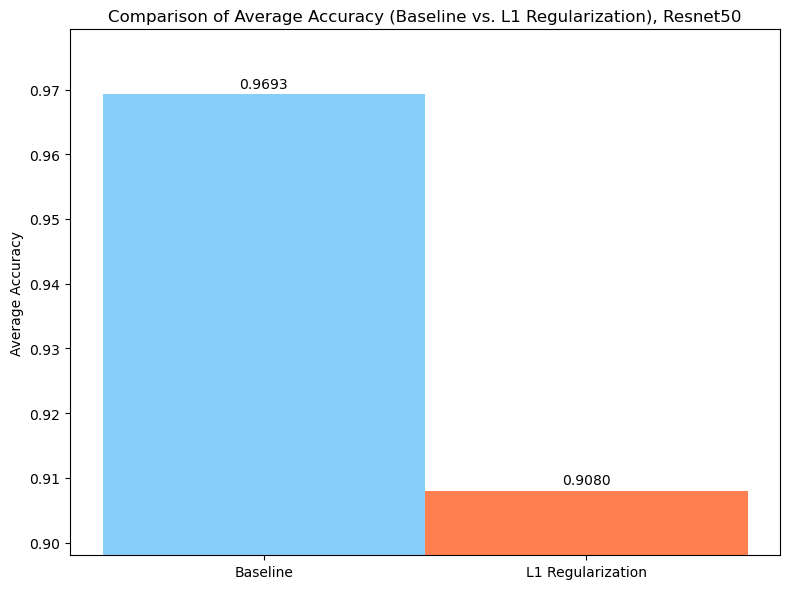

In [ ]:
average_accuracy = resnet50_filtered_df.groupby('Hypothesis Description')['Accuracy'].mean()

plt.figure(figsize=(8, 6))  # Adjust figsize as needed

x = average_accuracy.index
y = average_accuracy.values
# make the bars closer to each other
bar_width = 0.5

plt.bar([0,0.5], y, bar_width, color=colors)
plt.xticks([0,0.5], ['Baseline', 'L1 Regularization'])

plt.ylabel('Average Accuracy')
plt.title('Comparison of Average Accuracy (Baseline vs. L1 Regularization), Resnet50')

# Display average accuracy values above the bars
for i, acc in enumerate(y):
    plt.text(i/2, acc + 0.0005, f'{acc:.4f}', ha='center', va='bottom')

# Set y-axis limits based on the minimum and maximum average accuracy
plt.ylim(min(y) - 0.01, max(y) + 0.01)

plt.tight_layout()
plt.show()

As seen in the graph above, $L_1$ regularization significantly decreases our model accuracy.

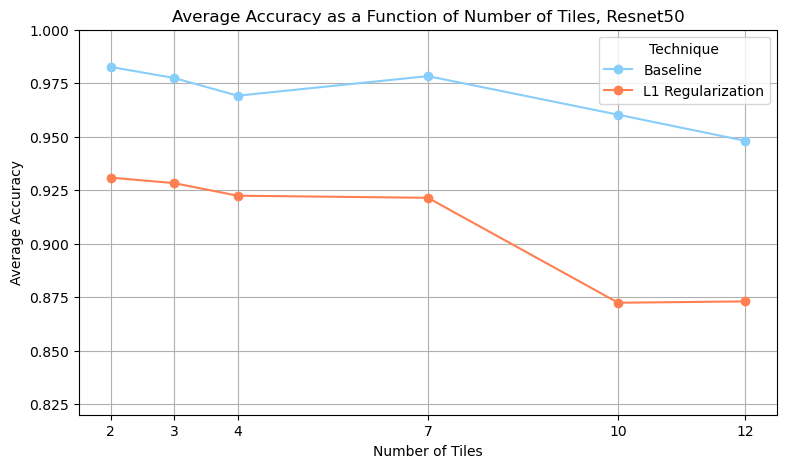

In [ ]:
# Calculate the average accuracy for each number of tiles and model
average_accuracies = resnet50_filtered_df.groupby(['Num Tiles', 'Hypothesis Description'])['Accuracy'].mean().unstack()
average_accuracies.columns = ['Baseline','L1 Regularization']

plt.figure(figsize=(9, 5))
for i,technique in enumerate(average_accuracies.columns):
    plt.plot(average_accuracies[technique], label=technique, marker='o',color=colors[i])

plt.title('Average Accuracy as a Function of Number of Tiles, Resnet50')
plt.xlabel('Number of Tiles')
plt.ylabel('Average Accuracy')
plt.xticks(average_accuracies.index)
plt.ylim(0.82, 1)  # Set the y-axis limit to show from 0.9 to 1 for clarity
plt.legend(title='Technique')
plt.grid(True)

plt.show()

As seen in the graph above $L_1$ regularization worsen our results in all of our experiments. The regularization might have been too aggressive and zero out important tiles.

In addition we chose $\lambda_1=0.001$, fine tuning this parameter can improve our results.

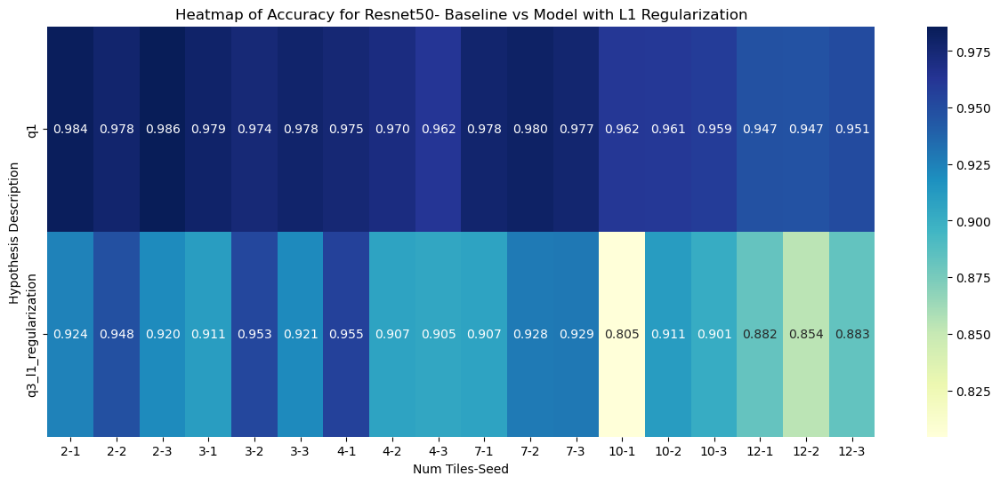

In [ ]:
pivot_table = resnet50_filtered_df.pivot_table(values='Accuracy', index='Hypothesis Description', columns=['Num Tiles', 'Seed'])
plt.figure(figsize=(15, 6))
sns.heatmap(pivot_table, annot=True,fmt='.3f', cmap='YlGnBu')
plt.title('Heatmap of Accuracy for Resnet50- Baseline vs Model with L1 Regularization', fontsize=12)

plt.show()

In the above heatmap we can see the same trends in both models, with specific results.

#### L2 Regularization

**Our motivation and intuition** for using $L_2$ regularization in our case since our images are permuted, the important image features can be anywhere in the image and we need to take into account all of the tiles in the image.

While this might act in the opposite way to the $L_1$ regularization, we wanted to cover and test both of these regularization.

In [ ]:
seed_values = global_seed_values
num_tiles_list = num_tiles_values
models_names = ['resnet50']
hypothesis_description = 'q3_l2_regularization'

In [ ]:
for model_name in models_names:
    for seed in seed_values:
        for num_tiles in num_tiles_list:

            train_dir = get_permuted_path('train_dataset_directory', seed=seed, num_tiles=num_tiles,permuted_train_tiles_seeds_paths=permuted_train_tiles_seeds_paths)
            test_dir = get_permuted_path('test_dataset_directory', seed=seed, num_tiles=num_tiles,permuted_train_tiles_seeds_paths=permuted_train_tiles_seeds_paths)

            print(f"Training from directory: {train_dir}")

            train_loader, test_loader, val_loader = get_datasets(model_name, train_dir, test_dir, train_transform=transform, test_transform=transform, batch_size=batch_size, num_workers=num_workers)

            model = define_model(model_name, train_dir)
            model = train_model(
                train_loader=train_loader,
                val_loader=val_loader,
                num_epochs=num_epochs,
                batch_size=batch_size,
                learning_rate=learning_rate,
                desired_image_size=desired_image_size,
                model_name=model_name,
                num_tiles=num_tiles,
                seed=seed,
                hypothesis_description=hypothesis_description,
                model_path=None,
                model = model,
                use_l2_regularization = True
                )


            print('-------------------------------')
            print(f"Evaluating from directory: {test_dir}")

            metrics_df, conf_matrix = evaluate_model_and_get_metrics(
                model=model,
                test_loader=test_loader,
                model_name=model_name,
                seed=seed,
                num_tiles=num_tiles,
                hypothesis_description=hypothesis_description
            )

            print(f"Results for Seed: {seed}, Num Tiles: {num_tiles}")
            print(metrics_df)
            print(conf_matrix)
            print('-------------------------------')

print("Final Metrics DataFrame:")
print(df_model_metrics)

In [ ]:
q1_q3_l2_reg_df = df_model_metrics[(df_model_metrics['Model'] == 'resnet50') & (df_model_metrics['Hypothesis Description'].isin(['q1', 'q3_l2_regularization']))]
q1_q3_l2_reg_df.drop(columns=['Complexity'], inplace=True)

In [ ]:
q1_q3_l2_reg_df['Num Tiles'] = q1_q3_l2_reg_df['Num Tiles'].astype(int)
q1_q3_l2_reg_df['Seed'] = q1_q3_l2_reg_df['Seed'].astype(int)

##### Resntet50 Metrics Comparision

In [ ]:
resnet50_filtered_df = q1_q3_l2_reg_df[(q1_q3_l2_reg_df['Model'] == 'resnet50')]

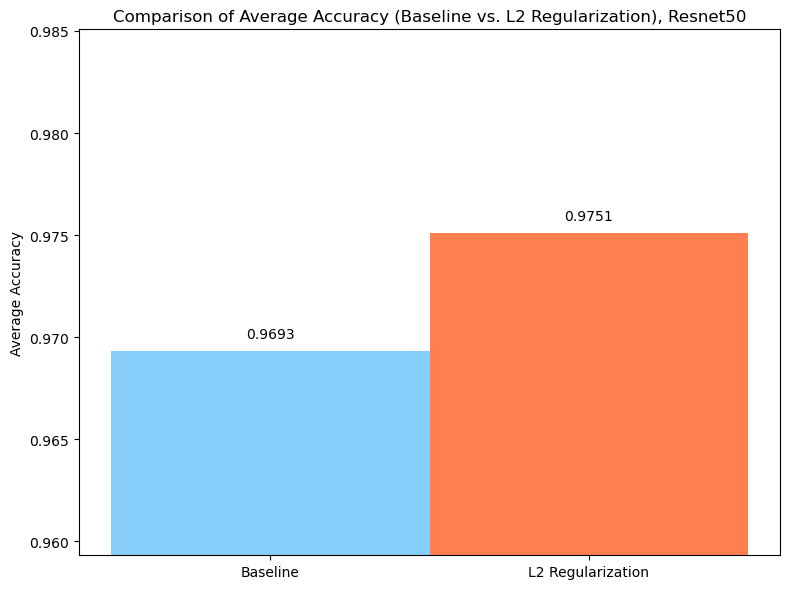

In [ ]:
average_accuracy = resnet50_filtered_df.groupby('Hypothesis Description')['Accuracy'].mean()

plt.figure(figsize=(8, 6))  # Adjust figsize as needed

x = average_accuracy.index
y = average_accuracy.values
# make the bars closer to each other
bar_width = 0.5

plt.bar([0,0.5], y, bar_width, color=colors)
plt.xticks([0,0.5], ['Baseline', 'L2 Regularization'])

plt.ylabel('Average Accuracy')
plt.title('Comparison of Average Accuracy (Baseline vs. L2 Regularization), Resnet50')

# Display average accuracy values above the bars
for i, acc in enumerate(y):
    plt.text(i/2, acc + 0.0005, f'{acc:.4f}', ha='center', va='bottom')

# Set y-axis limits based on the minimum and maximum average accuracy
plt.ylim(min(y) - 0.01, max(y) + 0.01)

plt.tight_layout()
plt.show()

As seen in the graph above $L_2$ regularization improves our results.

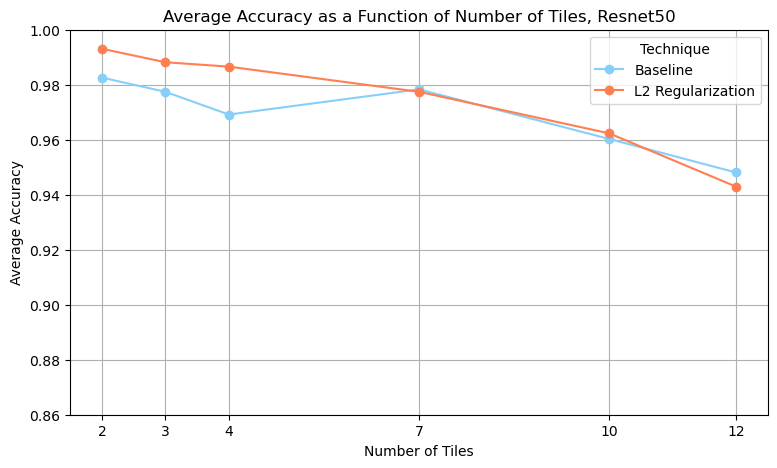

In [ ]:
# Calculate the average accuracy for each number of tiles and model
average_accuracies = resnet50_filtered_df.groupby(['Num Tiles', 'Hypothesis Description'])['Accuracy'].mean().unstack()
average_accuracies.columns = ['Baseline','L2 Regularization']

plt.figure(figsize=(9, 5))
for i,technique in enumerate(average_accuracies.columns):
    plt.plot(average_accuracies[technique], label=technique, marker='o',color=colors[i])

plt.title('Average Accuracy as a Function of Number of Tiles, Resnet50')
plt.xlabel('Number of Tiles')
plt.ylabel('Average Accuracy')
plt.xticks(average_accuracies.index)
plt.ylim(0.86, 1)  # Set the y-axis limit to show from 0.9 to 1 for clarity
plt.legend(title='Technique')
plt.grid(True)

plt.show()

As seen in the graph above $L_2$ regularization improves our accuracy for lower number of tiles (2,3,4) while keeping similar accuracy for higher number of tiles (7,10,12). As expected we mostly improved our results, like in previous section, when the number if tiles increases, each tile is harder to understand, resulting in lower accuracy.

In addition we chose $\lambda_2=0.001$, fine tuning this parameter can improve our results.

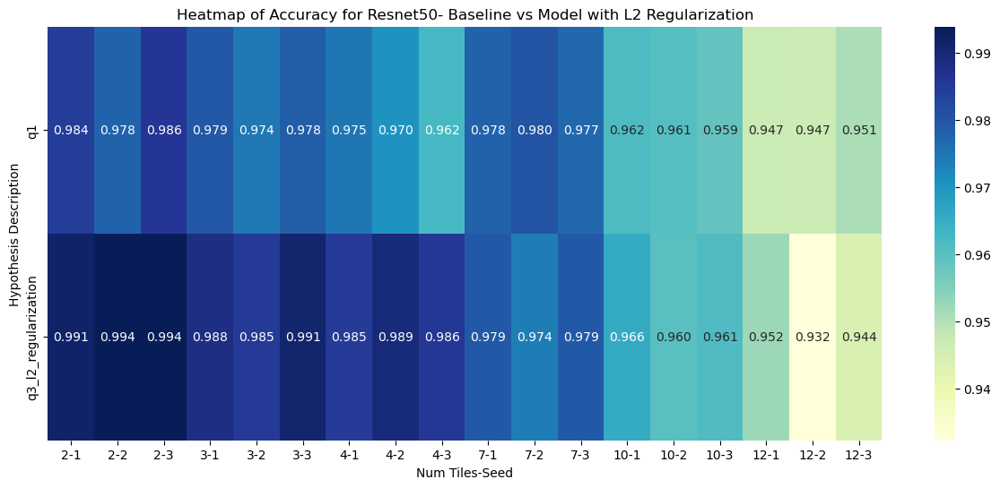

In [ ]:
pivot_table = resnet50_filtered_df.pivot_table(values='Accuracy', index='Hypothesis Description', columns=['Num Tiles', 'Seed'])
plt.figure(figsize=(15, 6))
sns.heatmap(pivot_table, annot=True,fmt='.3f', cmap='YlGnBu')
plt.title('Heatmap of Accuracy for Resnet50- Baseline vs Model with L2 Regularization', fontsize=12)

plt.show()

In the above heatmap we can see the same trends in both models, with specific results.

# Summary and conclusions

In [ ]:
df_model_metrics

,Model,Num Epochs,Batch Size,Learning Rate,Desired Image Size,Seed,Num Tiles,Hypothesis Description,Accuracy,Precision,Recall,F1-Score,Complexity
0,resnet50,5,32,0.00005,224,1,1,classic_image_classification,0.988267,0.988269,0.988267,0.988267,0.000000
1,vit,5,32,0.00005,224,1,1,classic_image_classification,0.993600,0.993609,0.993600,0.993600,0.000000
2,resnet50,5,32,0.00005,224,1,2,q1,0.984267,0.984292,0.984267,0.984267,27.414214
3,resnet50,5,32,0.00005,224,1,3,q1,0.979467,0.979476,0.979467,0.979466,86.714777
4,resnet50,5,32,0.00005,224,1,4,q1,0.974667,0.974680,0.974667,0.974665,169.350562
...,...,...,...,...,...,...,...,...,...,...,...,...,...
177,resnet50,5,32,0.00005,224,3,3,q3_l2_regularization,0.991200,0.991200,0.991200,0.991200,NaN
178,resnet50,5,32,0.00005,224,3,4,q3_l2_regularization,0.985600,0.985737,0.985600,0.985597,NaN
179,resnet50,5,32,0.00005,224,3,7,q3_l2_regularization,0.979200,0.979297,0.979200,0.979202,NaN
180,resnet50,5,32,0.00005,224,3,10,q3_l2_regularization,0.961333,0.961377,0.961333,0.961336,NaN


In [ ]:
df_model_metrics.to_csv('Final_metrics.csv', index=False)